# EDA: Predict Student Performance from Game Play
A great idea from Demid Chernenko: https://www.kaggle.com/code/demche/student-performance-from-game-play-eda

Thanks to him and all the participants who share their ideas.

# Import Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Read the files

In [2]:
dtypes = {'session_id': 'category',
          'elapsed_time': np.int32,
          'event_name': 'category',
          'name': 'category',
          'level': np.uint8,
          'page': 'category',
          'room_coor_x': np.float32,
          'room_coor_y': np.float32,
          'screen_coor_x': np.float32,
          'screen_coor_y': np.float32,
          'hover_duration': np.float32,
          'text': 'category',
          'fqid': 'category',
          'room_fqid': 'category',
          'text_fqid': 'category',
          'fullscreen': np.int8,
          'hq': np.int8,
          'music': np.int8,
          'level_group': 'category'}

train_df = pd.read_csv('/kaggle/input/predict-student-performance-from-game-play/train.csv', dtype=dtypes)
test_df = pd.read_csv('/kaggle/input/predict-student-performance-from-game-play/test.csv', dtype=dtypes)
labels_df = pd.read_csv('/kaggle/input/predict-student-performance-from-game-play/train_labels.csv')

In [3]:
print("Train: rows", len(train_df), "| columns", len(train_df.columns))
print("Test:  rows", len(test_df), "    | columns", len(test_df.columns))
print("Test:  rows", len(labels_df), "  | columns", len(labels_df.columns))

Train: rows 26296946 | columns 20
Test:  rows 3728     | columns 21
Test:  rows 424116   | columns 2


In [4]:
train_df.head(5)

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,level_group
0,20090312431273200,0,0,cutscene_click,basic,0,NaN,-413.991394,-159.314682,380.0,494.0,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,0,0,1,0-4
1,20090312431273200,1,1323,person_click,basic,0,NaN,-413.991394,-159.314682,380.0,494.0,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4
2,20090312431273200,2,831,person_click,basic,0,NaN,-413.991394,-159.314682,380.0,494.0,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4
3,20090312431273200,3,1147,person_click,basic,0,NaN,-413.991394,-159.314682,380.0,494.0,NaN,I gotta run to my meeting!,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4
4,20090312431273200,4,1863,person_click,basic,0,NaN,-412.991394,-159.314682,381.0,494.0,NaN,"Can I come, Gramps?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4


In [5]:
test_df.head(5)

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,...,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,level_group,session_level
0,20090109393214576,0,0,cutscene_click,basic,0,NaN,-413.991394,75.685310,380.0,...,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,0,0,1,0-4,0
1,20090109393214576,1,1965,person_click,basic,0,NaN,-105.991402,-63.314686,688.0,...,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4,0
2,20090109393214576,2,3614,person_click,basic,0,NaN,-418.991394,47.685314,375.0,...,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4,0
3,20090109393214576,3,5330,person_click,basic,0,NaN,-110.991402,-57.314686,683.0,...,NaN,I gotta run to my meeting!,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4,0
4,20090109393214576,4,6397,person_click,basic,0,NaN,-110.991402,-57.314686,683.0,...,NaN,"Can I come, Gramps?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4,0


In [6]:
labels_df.head(5)

,session_id,correct
0,20090312431273200_q1,1
1,20090312433251036_q1,0
2,20090312455206810_q1,1
3,20090313091715820_q1,0
4,20090313571836404_q1,1


In [7]:
print("Train data statistics:")
train_df.describe().apply(lambda x: x.apply('{0:.1f}'.format))

Train data statistics:


,index,elapsed_time,level,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,fullscreen,hq,music
count,26296946.0,26296946.0,26296946.0,24223674.0,24223674.0,24223674.0,24223674.0,2002244.0,26296946.0,26296946.0,26296946.0
mean,644.5,4016693.9,12.2,-54.9,-116.2,458.4,385.6,3471.0,0.1,0.1,0.9
std,545.8,31270320.4,6.5,520.3,218.5,247.9,129.8,460202.4,0.3,0.3,0.3
min,0.0,0.0,0.0,-1992.4,-918.2,0.0,0.0,0.0,0.0,0.0,0.0
25%,288.0,439700.0,6.0,-352.8,-212.7,269.0,304.0,99.0,0.0,0.0,1.0
50%,595.0,1014801.0,13.0,-11.2,-97.6,447.0,397.0,419.0,0.0,0.0,1.0
75%,896.0,1747040.0,18.0,296.7,22.7,663.0,471.0,1266.0,0.0,0.0,1.0
max,20473.0,1988606704.0,22.0,1261.8,543.6,1919.0,1440.0,245163696.0,1.0,1.0,1.0


In [8]:
print("Test data statistics:")
test_df.describe().apply(lambda x: x.apply('{0:.1f}'.format))

Test data statistics:


,index,elapsed_time,level,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,fullscreen,hq,music,session_level
count,3728.0,3728.0,3728.0,3366.0,3366.0,3366.0,3366.0,353.0,3728.0,3728.0,3728.0,3728.0
mean,670.4,2065026.1,12.2,-14.7,-131.1,463.7,394.4,1415.6,0.0,0.0,1.0,4.1
std,411.2,2079750.0,6.3,511.1,224.0,243.7,133.5,2664.6,0.0,0.0,0.0,2.4
min,0.0,0.0,0.0,-1913.1,-908.3,0.0,10.0,15.0,0.0,0.0,1.0,0.0
25%,320.0,570875.0,7.0,-290.1,-232.8,278.2,320.2,83.0,0.0,0.0,1.0,2.0
50%,642.0,1174912.0,11.0,16.8,-109.0,460.0,408.0,416.0,0.0,0.0,1.0,4.0
75%,983.2,2481633.8,18.0,355.1,1.0,680.0,486.0,1316.0,0.0,0.0,1.0,6.0
max,1563.0,6524025.0,22.0,1214.9,489.5,879.0,658.0,23451.0,0.0,0.0,1.0,8.0


In [9]:
stat = pd.DataFrame([train_df.nunique(), test_df.nunique()]).T.fillna(0)
stat.columns = ['Number of unique values in train', 'Number of unique values in test']
stat.head(30).style.format("{:,.0f}").background_gradient(cmap='YlGn')

,Number of unique values in train,Number of unique values in test
session_id,"23,562",3
index,"20,348","1,564"
elapsed_time,"5,042,639","3,720"
event_name,11,11
name,6,6
level,23,23
page,7,7
room_coor_x,"12,538,215","2,964"
room_coor_y,"9,551,136","2,532"
screen_coor_x,"57,477",801


# Exploring the data

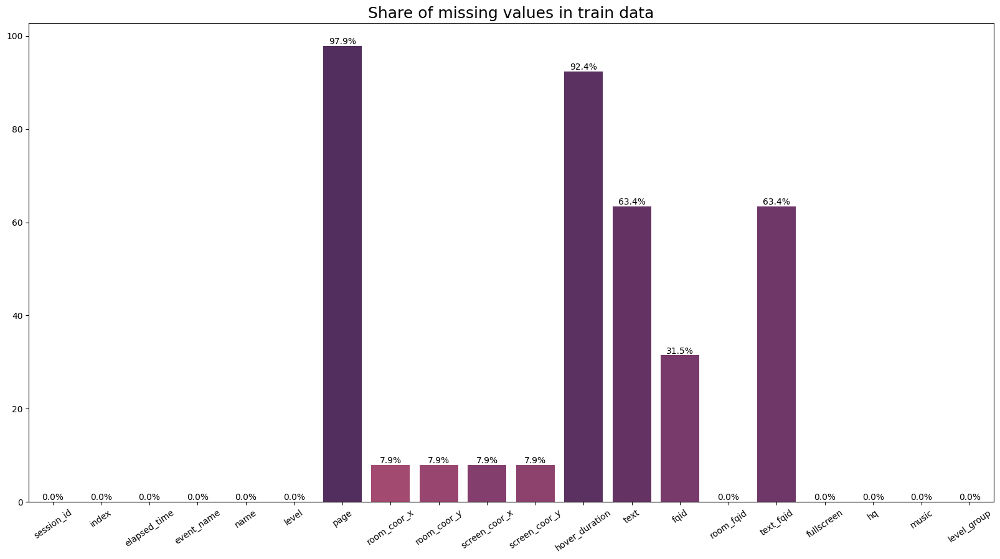

In [10]:
train_missing = train_df.isna().sum() / len(train_df) *100
plt.figure(figsize=(20, 10))
pal = sns.color_palette("flare", len(train_missing))
rank = train_missing.argsort().argsort()
g = sns.barplot(x=train_missing.index, y=train_missing, palette=np.array(pal[::])[rank])
g.axes.set_title("Share of missing values in train data", fontsize=18)
g.bar_label(g.containers[0], fmt="%.1f%%")
g.xaxis.set_tick_params(rotation=35)
del train_missing, g, pal, rank

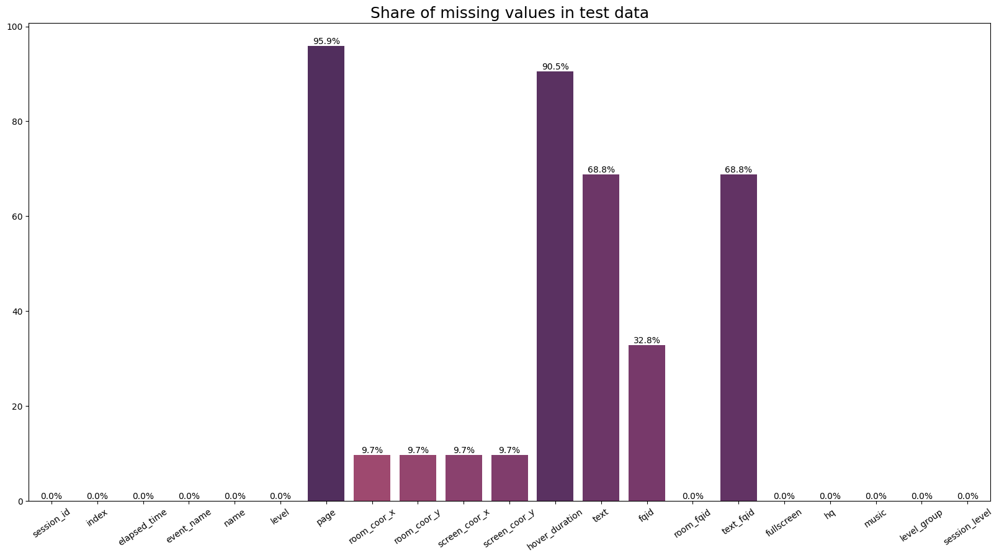

In [11]:
test_missing = test_df.isna().sum() / len(test_df) *100
plt.figure(figsize=(20, 10))
pal = sns.color_palette("flare", len(test_missing))
rank = test_missing.argsort().argsort()
g = sns.barplot(x=test_missing.index, y=test_missing, palette=np.array(pal[::])[rank])
g.axes.set_title("Share of missing values in test data", fontsize=18)
g.bar_label(g.containers[0], fmt="%.1f%%")
g.xaxis.set_tick_params(rotation=35)
del test_missing, g, pal, rank

/tmp/ipykernel_18/3449644510.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  g = sns.heatmap(train_df.corr(), annot=True, square=True, cmap='coolwarm', annot_kws={'size': 15},fmt='.2f')


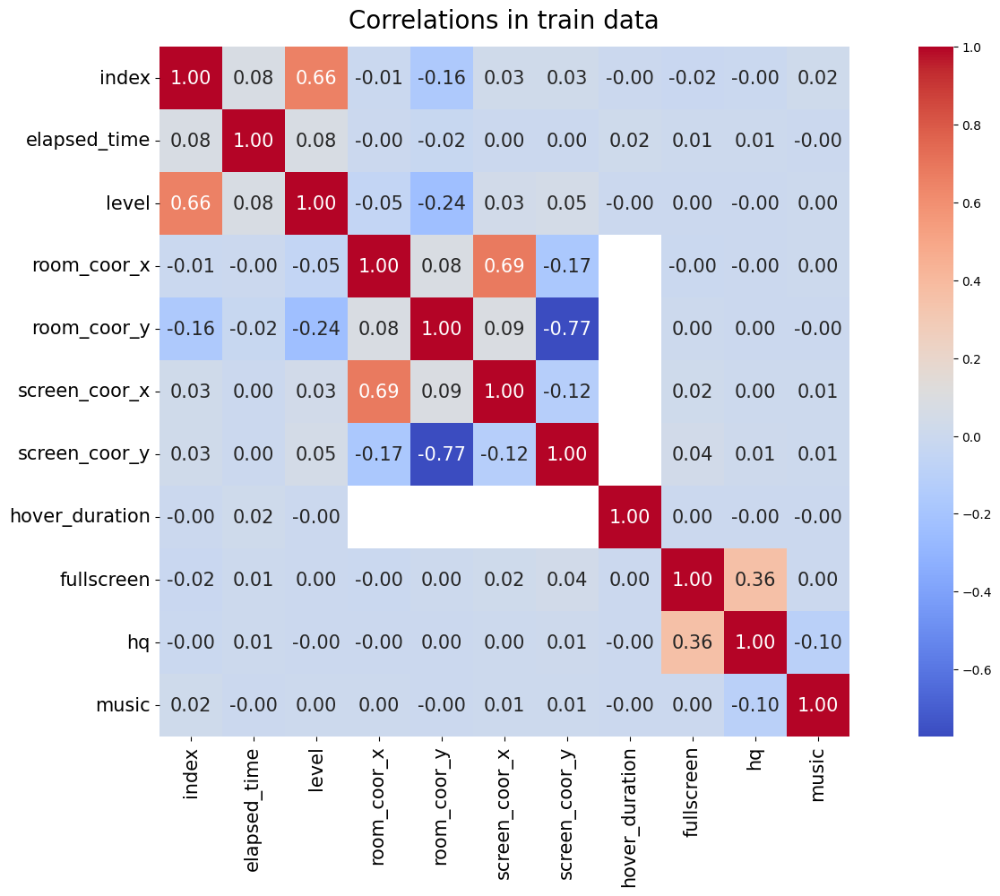

In [12]:
plt.figure(figsize=(20, 10))
g = sns.heatmap(train_df.corr(), annot=True, square=True, cmap='coolwarm', annot_kws={'size': 15},fmt='.2f')
g.tick_params(axis='x', labelsize=15)
g.tick_params(axis='y', labelsize=15)
g.set_title('Correlations in train data', size=20, pad=15)
plt.show()

/tmp/ipykernel_18/153281616.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  g = sns.heatmap(test_df.corr(), annot=True, square=True, cmap='coolwarm', annot_kws={'size': 15},fmt='.2f')


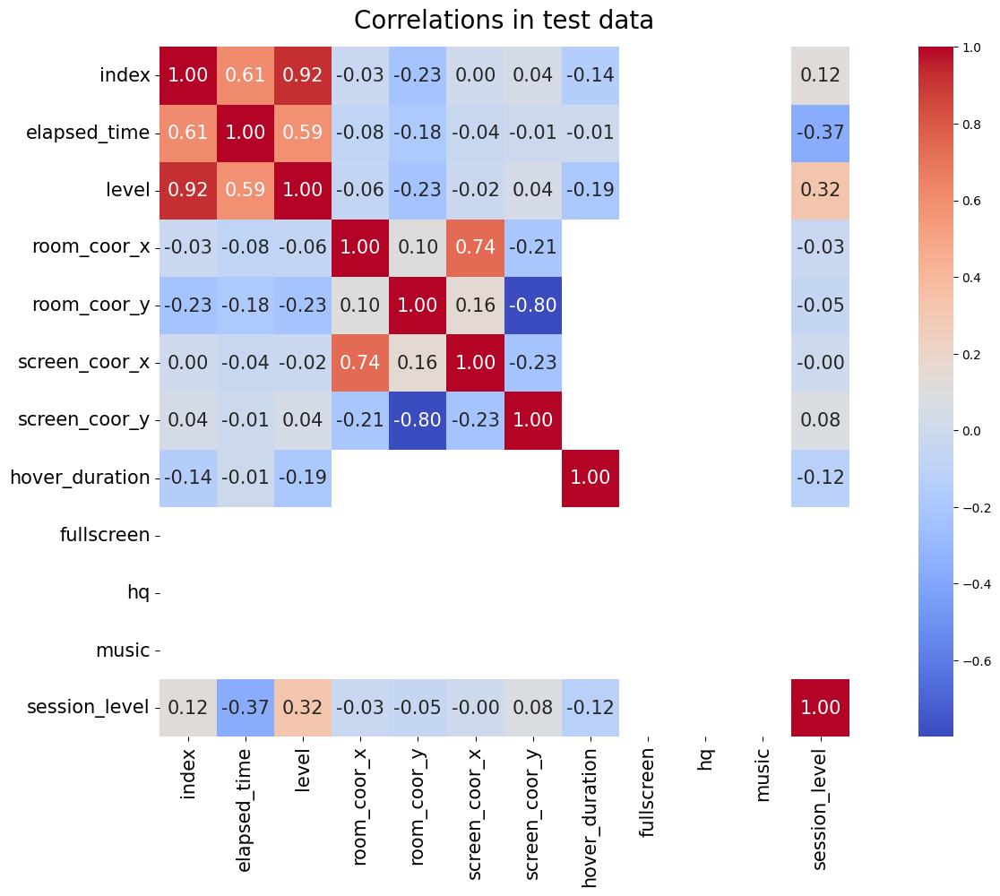

In [13]:
plt.figure(figsize=(20, 10))
g = sns.heatmap(test_df.corr(), annot=True, square=True, cmap='coolwarm', annot_kws={'size': 15},fmt='.2f')
g.tick_params(axis='x', labelsize=15)
g.tick_params(axis='y', labelsize=15)
g.set_title('Correlations in test data', size=20, pad=15)
plt.show()

In [14]:
labels_df.describe().T

,count,mean,std,min,25%,50%,75%,max
correct,424116.0,0.705635,0.455757,0.0,0.0,1.0,1.0,1.0


            count      mean       std  min  25%  50%  75%  max
correct  424116.0  0.705635  0.455757  0.0  0.0  1.0  1.0  1.0


/tmp/ipykernel_18/1673828783.py:4: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  labels_df[['session_id_id', 'question_number']] = labels_df['session_id'].str.split('_', 1, expand=True)


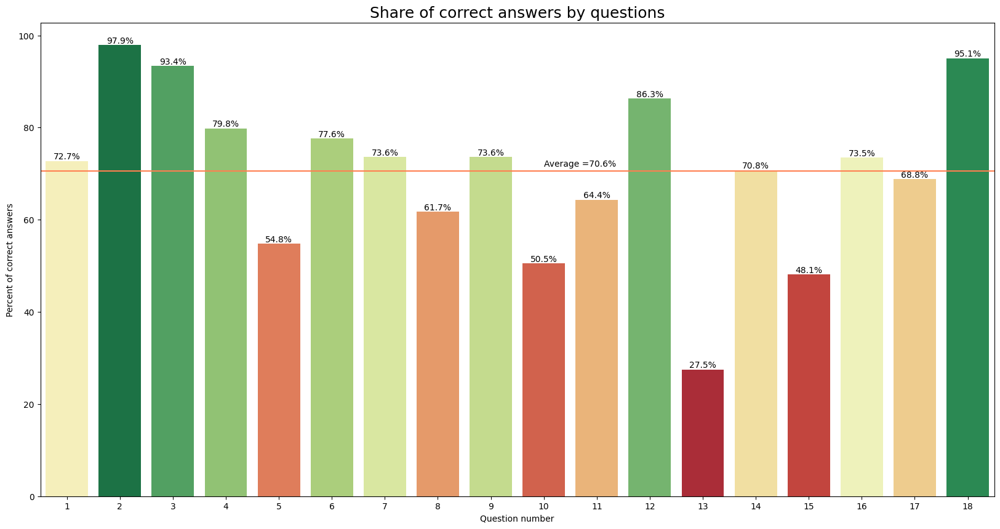

In [15]:
print(labels_df.describe().T)


labels_df[['session_id_id', 'question_number']] = labels_df['session_id'].str.split('_', 1, expand=True)
labels_df['session_id_id'] = labels_df['session_id_id'].astype(np.int64)
mean_correct = (labels_df['correct'].mean()*100).astype(np.float64)

labels_perc = labels_df.groupby('question_number')['correct'].value_counts(normalize=True).mul(100).rename('Percent').reset_index()
labels_perc['number'] = labels_perc['question_number'].apply(lambda x: int(x[1:])).astype(np.int64)
labels_perc = labels_perc[labels_perc['correct'] == 1]
pal = sns.color_palette("RdYlGn", len(labels_perc))
rank = labels_perc.sort_values('number')['Percent'].argsort().argsort()
plt.figure(figsize=(20, 10))
g = sns.barplot(data=labels_perc, x='number', y="Percent", palette=np.array(pal[::])[rank])
g.axhline(mean_correct, color="coral")
plt.text(9, mean_correct+1, f'Average ={round(mean_correct, 1)}%')
g.axes.set_title("Share of correct answers by questions", fontsize=18)
g.set(xlabel='Question number', ylabel='Percent of correct answers')
g.bar_label(g.containers[0], fmt="%.1f%%")
del g, labels_perc, pal, rank, mean_correct

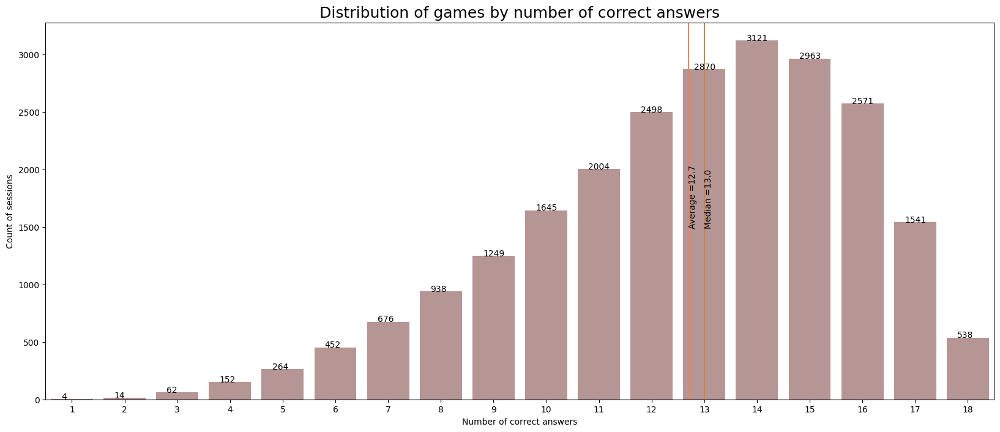

In [16]:
correct_answers_per_session = labels_df.groupby('session_id_id')['correct'].sum()
mean_correct_answers_per_session = correct_answers_per_session.mean()
median_correct_answers_per_session = correct_answers_per_session.median()
correct_answers_per_session = correct_answers_per_session.value_counts()
plt.figure(figsize=(20, 8))
g = sns.barplot(x=correct_answers_per_session.index, y=correct_answers_per_session.values, color='rosybrown')
plt.title('Distribution of games by number of correct answers', fontsize=18)
g.set_xticklabels(['{}'.format(int(num + 1)) for num in g.get_xticks()])
g.set(xlabel='Number of correct answers', ylabel='Count of sessions')
g.axvline(x=mean_correct_answers_per_session-1, color="coral")
g.text(mean_correct_answers_per_session-1, 1500, f'Average ={round(mean_correct_answers_per_session, 1)}', rotation=90)
g.axvline(x=median_correct_answers_per_session-1, color="peru")
g.text(median_correct_answers_per_session-1, 1500, f'Median ={round(median_correct_answers_per_session, 1)}', rotation=90)
for i, v in enumerate(correct_answers_per_session.sort_index().values):
    plt.text(i-0.2, v, str(int(v)))
del correct_answers_per_session, mean_correct_answers_per_session, median_correct_answers_per_session, i, v
plt.show()

In [17]:
train_events_counts = train_df['session_id'].value_counts()
test_events_counts = test_df['session_id'].value_counts()

stat = pd.DataFrame([train_events_counts.describe().index,
                    np.round(train_events_counts.describe(), 2).values,
                    np.round(test_events_counts.describe(), 2).values]).T
stat.columns = [' ', 'train', 'test']
stat[['train', 'test']] = stat[['train', 'test']].astype(np.float64)
print(f'Unique sessions in train: {len(train_events_counts)}')
print(f'Unique sessions in test: {len(test_events_counts)}')
print('\n\nStatistics of events per session:')
stat[1:].style.hide_index().format(precision=1).background_gradient(cmap='YlGn')

Unique sessions in train: 23562
Unique sessions in test: 3


Statistics of events per session:


/tmp/ipykernel_18/1117547323.py:12: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  stat[1:].style.hide_index().format(precision=1).background_gradient(cmap='YlGn')


,train,test
mean,1116.1,1242.7
std,352.9,268.5
min,591.0,965.0
25%,901.0,1113.5
50%,1033.0,1262.0
75%,1231.0,1381.5
max,19032.0,1501.0


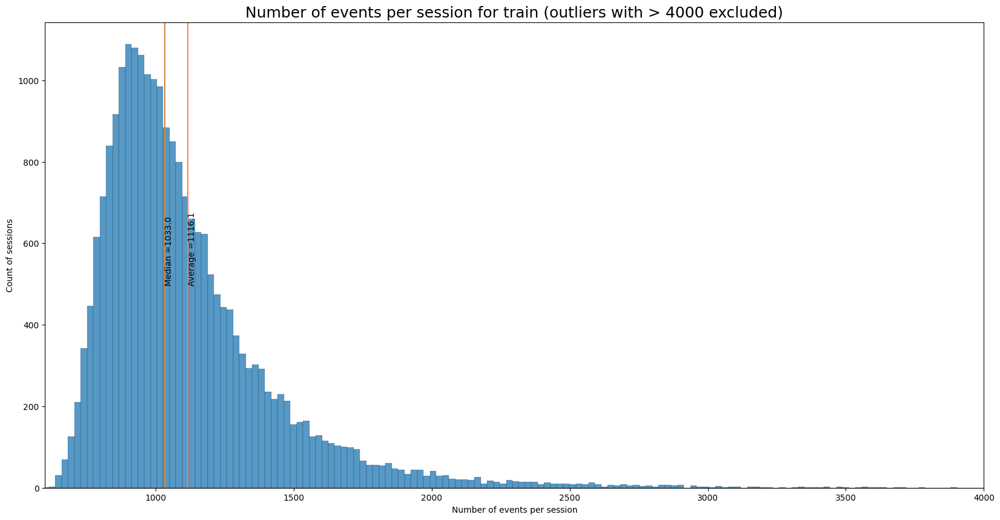

In [18]:
# session_id is the ID of the session the event took place in. We have 11779 unique sessions in the train, but only 3 in the test.

mean_train_events_counts = train_events_counts.mean()
median_train_events_counts = train_events_counts.median()
plt.figure(figsize=(20, 10))
g = sns.histplot(data=train_events_counts)
plt.title('Number of events per session for train (outliers with > 4000 excluded)', fontsize=18)
g.set(xlabel='Number of events per session', ylabel='Count of sessions')
plt.axvline(x=mean_train_events_counts, color="coral")
plt.text(mean_train_events_counts, 500, f'Average ={round(mean_train_events_counts, 1)}', rotation=90)
plt.axvline(x=median_train_events_counts, color="peru")
plt.text(median_train_events_counts, 500, f'Median ={round(median_train_events_counts, 1)}', rotation=90)
plt.xlim(600, 4000)
plt.show()
del train_events_counts, mean_train_events_counts, median_train_events_counts, test_events_counts, stat, g

In [19]:
#index: is the index of the event for the session. Despite naive expectation, combination of session_id and index is not unique, there are duplicates

idx = train_df[['session_id', 'index']]
idx_dupl = idx[idx.duplicated()]
print(f"\nNumber of duplicated combinations session_id/index: {len(idx_dupl)}")
print(f"\nNumber of sessions with duplicates: {len(idx_dupl['session_id'].unique())}")
print("\nExamples of sessions with duplicates:", idx_dupl['session_id'].unique()[:4])


Number of duplicated combinations session_id/index: 34534

Number of sessions with duplicates: 142

Examples of sessions with duplicates: ['20110422113670820', '20110507081078290', '20110507133502024', '20110507320323120']
Categories (23562, object): ['20090312431273200', '20090312433251036', '20090312455206810', '20090313091715820', ..., '22100215460321130', '22100217104993650', '22100219442786200', '22100221145014656']


In [20]:
# elapsed_time: shows how much time has passed (in milliseconds) between the start of the session and when the event was recorded

elapsed_time_train = np.round((train_df['elapsed_time']).astype(np.float64)/60000.0, 1)
elapsed_time_test = np.round((test_df['elapsed_time']).astype(np.float64)/60000.0, 1)

stat = pd.DataFrame([elapsed_time_train.describe().index,
                    np.round(elapsed_time_train.describe(), 2).values,
                    np.round(elapsed_time_test.describe(), 2).values]).T
stat.columns = [' ', 'train', 'test']
stat[['train', 'test']] = stat[['train', 'test']].astype(np.float64)
print('Elapsed time statistics for events:')
stat[1:].style.hide_index().format(precision=1).background_gradient(cmap='YlGn')

Elapsed time statistics for events:


/tmp/ipykernel_18/1942861960.py:12: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  stat[1:].style.hide_index().format(precision=1).background_gradient(cmap='YlGn')


,train,test
mean,66.9,34.4
std,521.2,34.7
min,0.0,0.0
25%,7.3,9.5
50%,16.9,19.6
75%,29.1,41.4
max,33143.4,108.7


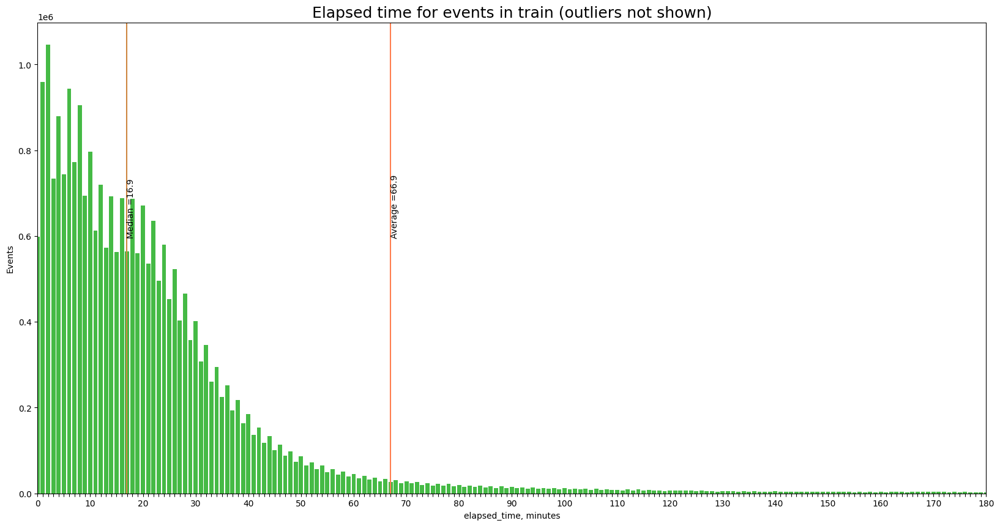

In [21]:
mean_elapsed_time_train = elapsed_time_train.mean()
median_elapsed_time_train = elapsed_time_train.median()
elapsed_time_train_counts = np.round(elapsed_time_train, 0).astype(np.int64).value_counts()

plt.figure(figsize=(20, 10))
g = sns.barplot(x=elapsed_time_train_counts.index, y=elapsed_time_train_counts.values, color='limegreen')
plt.title('Elapsed time for events in train (outliers not shown)', fontsize=18)
g.set_xticklabels(['{}'.format(int(num)) if i % 10 == 0 else '' for i, num in enumerate(g.get_xticks())])
g.set(xlabel='elapsed_time, minutes', ylabel='Events')
g.axvline(x=mean_elapsed_time_train, color="coral")
g.text(mean_elapsed_time_train, 600000, f'Average ={round(mean_elapsed_time_train, 1)}', rotation=90)
g.axvline(x=median_elapsed_time_train, color="peru")
g.text(median_elapsed_time_train, 600000, f'Median ={round(median_elapsed_time_train, 1)}', rotation=90)
del mean_elapsed_time_train, median_elapsed_time_train, elapsed_time_train_counts
plt.xlim(0, 180)
plt.show()

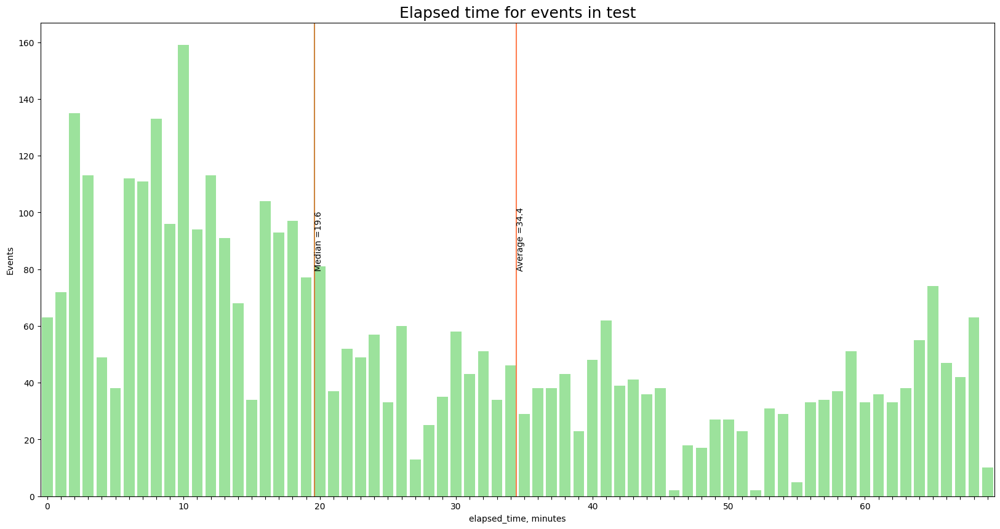

In [22]:
mean_elapsed_time_test = elapsed_time_test.mean()
median_elapsed_time_test = elapsed_time_test.median()
elapsed_time_test_counts  = np.round(elapsed_time_test, 0).astype(np.int64).value_counts()

plt.figure(figsize=(20, 10))
g = sns.barplot(x=elapsed_time_test_counts.index, y=elapsed_time_test_counts.values, color='lightgreen')
plt.title('Elapsed time for events in test', fontsize=18)
g.set_xticklabels(['{}'.format(int(num)) if i % 10 == 0 else '' for i, num in enumerate(g.get_xticks())])
g.set(xlabel='elapsed_time, minutes', ylabel='Events')
g.axvline(x=mean_elapsed_time_test, color="coral")
g.text(mean_elapsed_time_test, 80, f'Average ={round(mean_elapsed_time_test, 1)}', rotation=90)
g.axvline(x=median_elapsed_time_test, color="peru")
g.text(median_elapsed_time_test, 80, f'Median ={round(median_elapsed_time_test, 1)}', rotation=90)
del mean_elapsed_time_test, median_elapsed_time_test, elapsed_time_test_counts
plt.show()

In [23]:
train_df['elapsed_time_change'] = (train_df.groupby('session_id')['elapsed_time'].diff()).astype(np.float32)
print(f"Number of events with negative elapsed time change: {len(train_df[train_df['elapsed_time_change'] < 0])}")
print(f"Percent of events with negative elapsed time change: {round(len(train_df[train_df['elapsed_time_change'] < 0])/len(train_df)*100.0, 2)}\n")
print(f"Number of sessions with at least one negative elapsed time change: {len(train_df.loc[train_df['elapsed_time_change'] < 0, 'session_id'].unique())}")
print(f"Percent of sessions with at least one negative elapsed time change: {round(len(train_df.loc[train_df['elapsed_time_change'] < 0, 'session_id'].unique())*100.0/len(train_df['session_id'].unique()), 2)}")

Number of events with negative elapsed time change: 654500
Percent of events with negative elapsed time change: 2.49

Number of sessions with at least one negative elapsed time change: 23537
Percent of sessions with at least one negative elapsed time change: 99.89


In [24]:
# event_name is the event type (e.g. person click, cutscene click, object hover, etc)
# name is the event name (e.g. identifies whether a notebook_click is opening or closing the notebook)
# fqid: the fully qualified ID of the event (it refers to the person/object the player is interacting with)

event_names_counts_train = train_df['event_name'].value_counts()/1000
names_counts_train = train_df['name'].value_counts()/1000
fqid_counts_train = train_df['fqid'].value_counts()
event_names_counts_test = test_df['event_name'].value_counts()
names_counts_test = test_df['name'].value_counts()
fqid_counts_test = test_df['fqid'].value_counts()

print("Number of unique event names:", len(event_names_counts_train))
print("Number of unique names:", len(names_counts_train))
print("Number of unique fqid:", len(fqid_counts_train))

Number of unique event names: 11
Number of unique names: 6
Number of unique fqid: 128


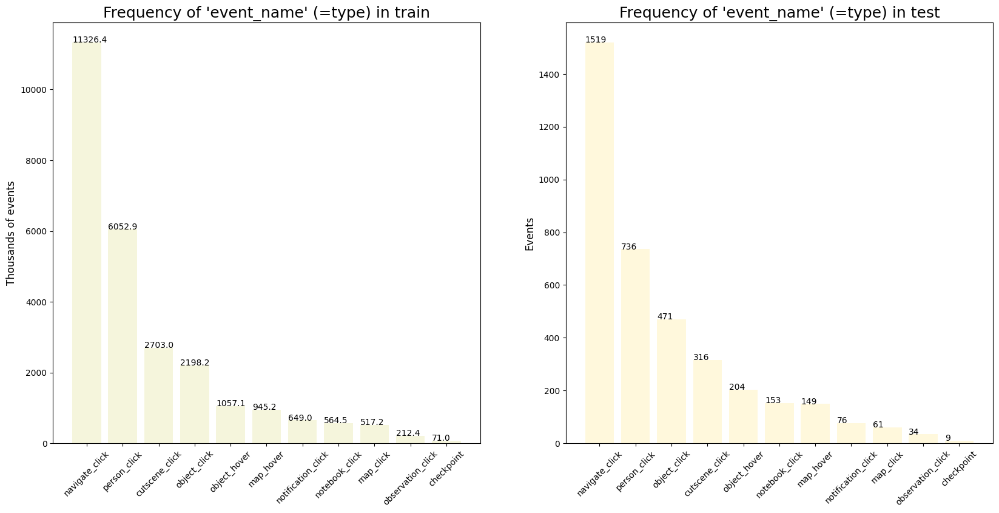

In [25]:
plt.figure(figsize=(20, 9))

plt.subplot(1, 2, 1)
plt.bar(event_names_counts_train.index, event_names_counts_train.values, color='beige')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of 'event_name' (=type) in train", fontsize=18)
for i, v in enumerate(event_names_counts_train.values):
    plt.text(i-0.4, v, str(round(v, 1)))
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
plt.bar(event_names_counts_test.index, event_names_counts_test.values, color='cornsilk')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of 'event_name' (=type) in test", fontsize=18)
for i, v in enumerate(event_names_counts_test.values):
    plt.text(i-0.4, v, str(int(v)))
plt.xticks(rotation=45)

del i, v
plt.show()

# Meaning of the event_name:
# navigate_click: click on the place we want move protagonist (Jo) to move;
# observation_click: click on the black object that appears when you take your mouse pointer close to them;
# notification_click: after navigate click on an object like the notebook, the retirement letter - the click to hide or to continue after the text appears;
# object_click: click anywhere on the object pop up (only after notification_click)
# object_hover: the student takes the mouse pointer above an object;
# map_hover: the student takes the pointer above any place in the map;
# map_click: click on a place on the map to go there;
# notebook_click: click on notebook to look for notes made by Jo;
# checkpoint: the last event of a level-group/chapter in the data.

In [26]:
event_name_session_counts = pd.DataFrame(train_df.groupby('event_name')['session_id'].value_counts())
event_name_session_counts.columns = ['count']
event_name_session_counts = event_name_session_counts.reset_index(drop=False)
print("'event_name' counts per session in train:")
event_name_session_counts.groupby('event_name')['count'].describe().drop(columns=['count']).style.format(precision=2).background_gradient(cmap='YlGn')

'event_name' counts per session in train:


,mean,std,min,25%,50%,75%,max
event_name,,,,,,,
checkpoint,3.01,0.19,2.00,3.00,3.00,3.00,9.00
cutscene_click,114.72,15.86,67.00,103.00,114.00,122.00,483.00
map_click,21.95,10.58,13.00,16.00,19.00,24.00,753.00
map_hover,40.11,28.97,0.00,24.00,34.00,50.00,472.00
navigate_click,480.71,247.94,162.00,329.00,418.00,556.00,11493.00
notebook_click,23.96,30.16,0.00,5.00,16.00,35.00,2605.00
notification_click,27.54,5.15,20.00,24.00,26.00,30.00,114.00
object_click,93.29,62.90,32.00,57.00,75.00,108.00,3045.00
object_hover,44.86,20.40,0.00,35.00,44.00,55.00,232.00


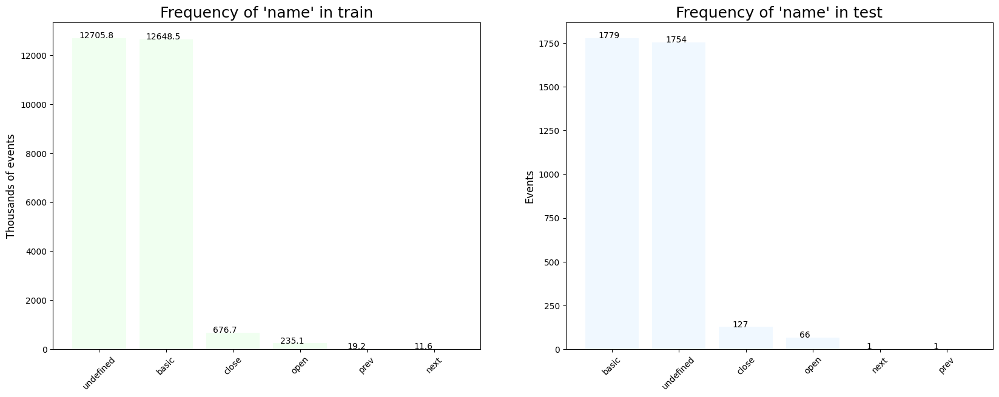

In [27]:
del event_name_session_counts
plt.figure(figsize=(20, 7))

plt.subplot(1, 2, 1)
plt.bar(names_counts_train.index, names_counts_train.values, color='honeydew')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of 'name' in train", fontsize=18)
for i, v in enumerate(names_counts_train.values):
    plt.text(i-0.3, v, str(round(v, 1)))
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
plt.bar(names_counts_test.index, names_counts_test.values, color='aliceblue')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of 'name' in test", fontsize=18)
for i, v in enumerate(names_counts_test.values):
    plt.text(i-0.2, v, str(int(v)))
plt.xticks(rotation=45)

del i, v
plt.show()

In [28]:
event_name_session_counts = pd.DataFrame(train_df.groupby(['event_name', 'name'])['session_id'].value_counts())
event_name_session_counts.columns = ['count']
event_name_session_counts = event_name_session_counts.reset_index(drop=False)
print("'event_name'/'name' counts per session in train:")
event_name_session_counts.groupby(['event_name', 'name'])['count'].describe().drop(columns=['count']).style.format(precision=2).background_gradient(cmap='YlGn')

'event_name'/'name' counts per session in train:


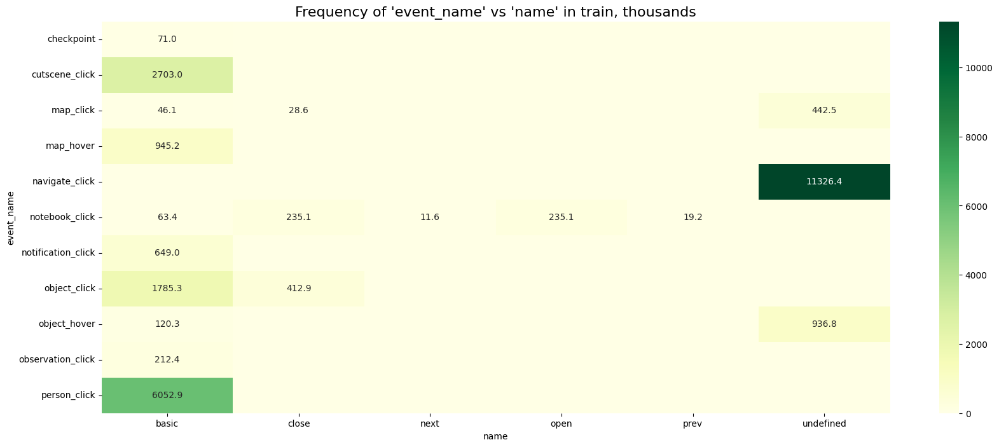

In [29]:
del event_name_session_counts
pivot = train_df.pivot_table(index='event_name', columns='name', aggfunc='size')
pivot = (pivot.fillna(0) / 1000).round(decimals = 1)
plt.figure(figsize=(20, 8))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'event_name' vs 'name' in train, thousands", fontsize=16)
plt.show()

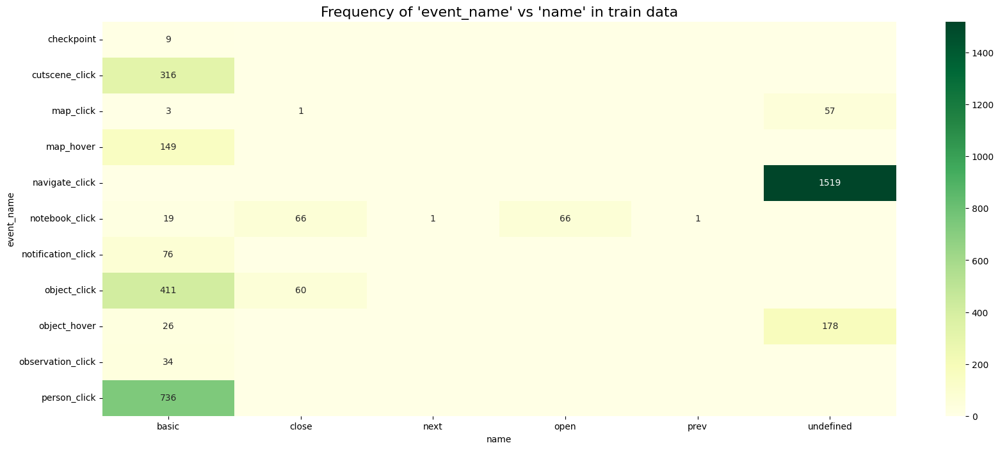

In [30]:
pivot = test_df.pivot_table(index='event_name', columns='name', aggfunc='size')
pivot = pivot.fillna(0).astype(int)
plt.figure(figsize=(20, 8))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'event_name' vs 'name' in train data", fontsize=16)
plt.show()
del g, pivot, annotations

In [31]:
print('TOP-20 fqid for events:')
stat = pd.DataFrame([fqid_counts_train, fqid_counts_test]).T
stat.columns = ['train', 'test']
stat = stat.sort_values('train', ascending=False)
del event_names_counts_train, names_counts_train, fqid_counts_train, event_names_counts_test, names_counts_test, fqid_counts_test
stat.head(20).style.format(precision=0)

TOP-20 fqid for events:


,train,test
worker,1878958,214
archivist,1127341,148
gramps,1122264,144
wells,787418,102
toentry,784496,94
confrontation,697098,78
crane_ranger,503927,54
groupconvo,455705,55
flag_girl,449742,53
tomap,403048,44


Number of unique rooms: 19


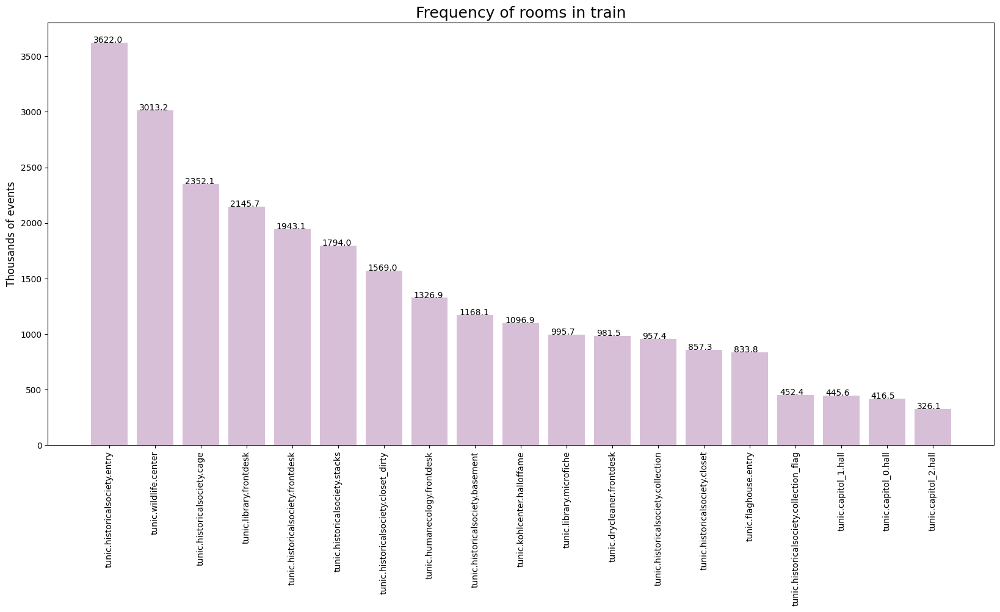

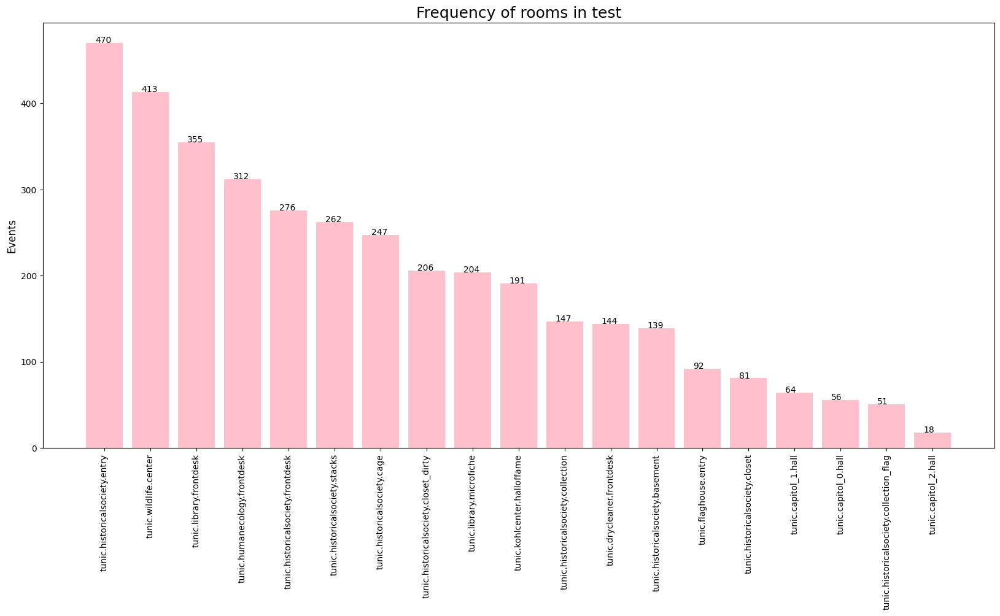

In [32]:
# room_fqid is the ID of the room the event took place in. The player progresses through the game by moving from one room to another.

room_counts_train = train_df['room_fqid'].value_counts()/1000
room_counts_test = test_df['room_fqid'].value_counts()

print("Number of unique rooms:", len(room_counts_train))

plt.figure(figsize=(20, 9))
plt.bar(room_counts_train.index, room_counts_train.values, color='thistle')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of rooms in train", fontsize=18)
for i, v in enumerate(room_counts_train.values):
    plt.text(i-0.35, v, str(round(v, 1)))
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(20, 9))
plt.bar(room_counts_test.index, room_counts_test.values, color='pink')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of rooms in test", fontsize=18)
for i, v in enumerate(room_counts_test.values):
    plt.text(i-0.2, v, str(int(v)))
plt.xticks(rotation=90)

del i, v
plt.show()

Number of sessions in which one of the 22 levels is not present: 577

Level 7 is missing in 576 sessions
Examples of sessions with missing 7 level: ['20090316190523732', '20100007445515820', '20100014211946468', '20100018421509572', '20100020122406090']

Level 15 is missing in 17 sessions
Examples of sessions with missing 15 level: ['20100020122406090', '20100110093663916', '20100309472366890', '20100512192183730', '20110410570739092']

Level 20 is missing in 561 sessions
Examples of sessions with missing 20 level: ['20090316190523732', '20100007445515820', '20100014211946468', '20100018421509572', '20100115005512812']

Level 21 is missing in 570 sessions
Examples of sessions with missing 21 level: ['20090316190523732', '20100007445515820', '20100014211946468', '20100018421509572', '20100020122406090']


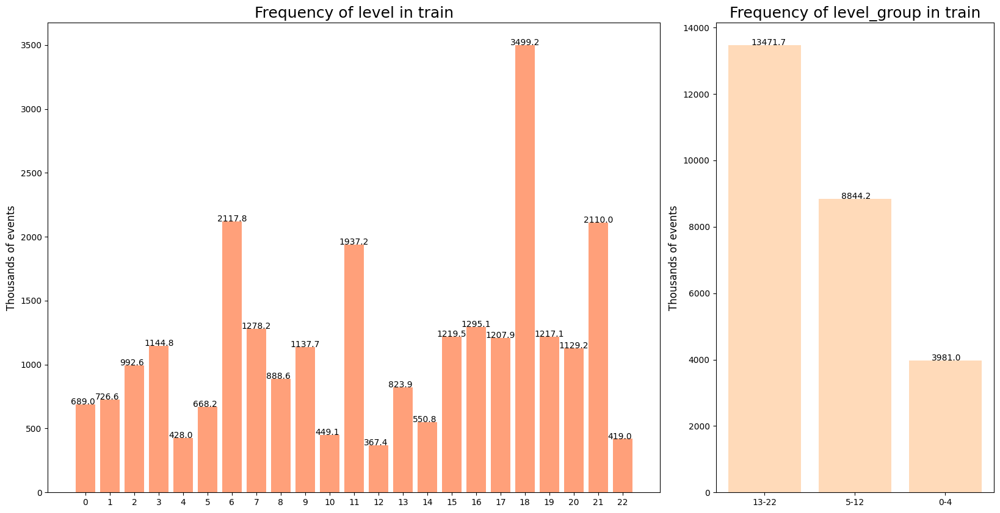

In [33]:
# level is what level of the game the event occurred in (0 to 22).
# level_group: which group of levels - and group of questions - this row belongs to (0-4, 5-12, 13-22)
# The number of questions in each level_group is fixed:

unique_levels_per_session = train_df[['session_id', 'level']].drop_duplicates()
missing_sessions = unique_levels_per_session.groupby('session_id').count().reset_index(drop=False)
missing_sessions = missing_sessions[missing_sessions['level'] != 23].reset_index(drop=True)['session_id']
print(f"Number of sessions in which one of the 22 levels is not present: {len(missing_sessions)}")
for lvl in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]:
    x = unique_levels_per_session.loc[(unique_levels_per_session['session_id'].isin(missing_sessions)) & (unique_levels_per_session['level'].eq(lvl))]
    if len(x) != len(missing_sessions):
        print(f"\nLevel {lvl} is missing in {len(x)} sessions")
        print(f"Examples of sessions with missing {lvl} level:", x['session_id'].to_list()[:5])
del lvl, x, unique_levels_per_session, missing_sessions

level_counts_train = train_df['level'].value_counts()/1000
level_group_counts_train = train_df['level_group'].value_counts()/1000
level_counts_test = test_df['level'].value_counts()
level_group_counts_test = test_df['level_group'].value_counts()

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, (1, 2))
plt.bar(level_counts_train.index, level_counts_train.values, color='lightsalmon')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of level in train", fontsize=18)
for i, v in enumerate(level_counts_train.sort_index().values):
    plt.text(i-0.6, v, str(round(v, 1)))
plt.xticks(level_counts_train.index)

plt.subplot(1, 3, 3)
plt.bar(level_group_counts_train.index, level_group_counts_train.values, color='peachpuff')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of level_group in train", fontsize=18)
for i, v in enumerate(level_group_counts_train):
    plt.text(i-0.15, v, str(round(v, 1)))
plt.xticks()
plt.show()

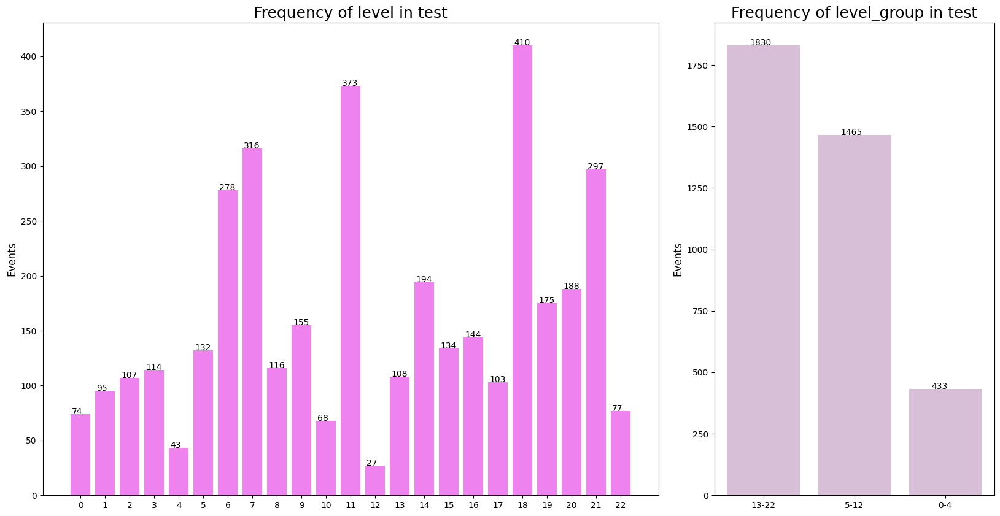

In [34]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 3, (1, 2))
plt.bar(level_counts_test.index, level_counts_test.values, color='violet')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of level in test", fontsize=18)
for i, v in enumerate(level_counts_test.sort_index().values):
    plt.text(i-0.35, v, str(int(v)))
plt.xticks(level_counts_train.index)

plt.subplot(1, 3, 3)
plt.bar(level_group_counts_test.index, level_group_counts_test.values, color='thistle')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of level_group in test", fontsize=18)
for i, v in enumerate(level_group_counts_test):
    plt.text(i-0.15, v, str(int(v)))
plt.xticks()
plt.show()

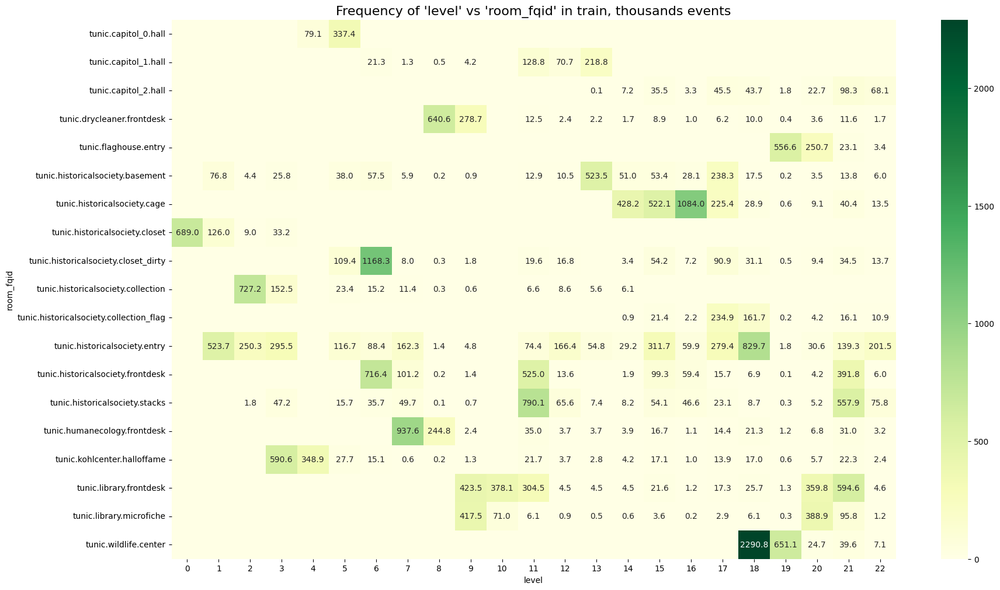

In [35]:
pivot = train_df.pivot_table(index='room_fqid', columns='level', aggfunc='size')
pivot = (pivot.fillna(0) / 1000).round(decimals = 1)
plt.figure(figsize=(20, 12))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'level' vs 'room_fqid' in train, thousands events", fontsize=16)
plt.show()

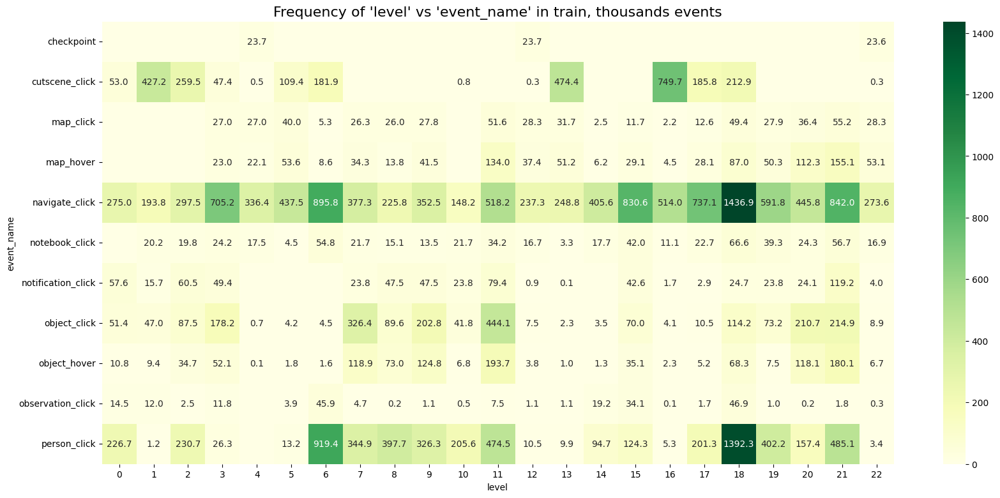

In [36]:
pivot = train_df.pivot_table(index='event_name', columns='level', aggfunc='size')
pivot = (pivot.fillna(0) / 1000).round(decimals = 1)
plt.figure(figsize=(20, 9))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'level' vs 'event_name' in train, thousands events", fontsize=16)
plt.show()

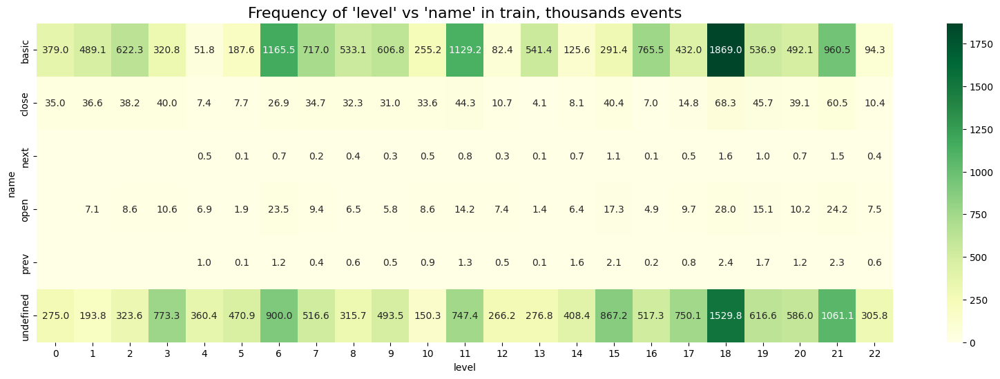

In [37]:
pivot = train_df.pivot_table(index='name', columns='level', aggfunc='size')
pivot = (pivot.fillna(0) / 1000).round(decimals = 1)
plt.figure(figsize=(20, 6))
annotations = pivot.astype(str)
annotations[pivot == 0] = ""
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='YlGn')
plt.title("Frequency of 'level' vs 'name' in train, thousands events", fontsize=16)
plt.show()

In [38]:
# click geo-location 
# There are four geo-location variables in the data:

# room_coor_x: the coordinates of the click in reference to the in-game room (only for click events)
# room_coor_y: the coordinates of the click in reference to the in-game room (only for click events)
# screen_coor_x: the coordinates of the click in reference to the player’s screen (only for click events)
# screen_coor_y: the coordinates of the click in reference to the player’s screen (only for click events)
# About 90-92% of all events are the click events:

print(f"Share of events with geo-location in train: {round(train_df['room_coor_x'].count() / len(train_df)*100, 2)}")
print(f"Share of events with geo-location in test: {round(test_df['room_coor_x'].count() / len(test_df)*100, 2)}")

Share of events with geo-location in train: 92.12
Share of events with geo-location in test: 90.29


In [39]:
stat = pd.DataFrame([train_df['room_coor_x'].describe().index.to_list(),
                    train_df['room_coor_x'].astype('float64').describe().values,
                    train_df['room_coor_y'].astype('float64').describe().values,
                    train_df['screen_coor_x'].astype('float64').describe().values,
                    train_df['screen_coor_y'].astype('float64').describe().values,
                    test_df['room_coor_x'].astype('float64').describe().values,
                    test_df['room_coor_y'].astype('float64').describe().values,
                    test_df['screen_coor_x'].astype('float64').describe().values,
                    test_df['screen_coor_y'].astype('float64').describe().values]).T
stat.columns = [' ', 'room_coor_x in train', 'room_coor_y in train', 'screen_coor_x in train', 'screen_coor_y in train',
                     'room_coor_x in test', 'room_coor_y in test', 'screen_coor_x in test', 'screen_coor_y in test']
stat[stat.columns.to_list()[1:]] = stat[stat.columns.to_list()[1:]].apply(pd.to_numeric, errors='coerce' )
print('Geo-location statistics for events:')
stat[1:].style.hide_index().format(precision=1).background_gradient(cmap='YlGn')

Geo-location statistics for events:


/tmp/ipykernel_18/2960123577.py:14: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  stat[1:].style.hide_index().format(precision=1).background_gradient(cmap='YlGn')


,room_coor_x in train,room_coor_y in train,screen_coor_x in train,screen_coor_y in train,room_coor_x in test,room_coor_y in test,screen_coor_x in test,screen_coor_y in test
mean,-54.9,-116.2,458.4,385.6,-14.7,-131.1,463.7,394.4
std,520.3,218.5,247.9,129.8,511.1,224.0,243.7,133.5
min,-1992.4,-918.2,0.0,0.0,-1913.1,-908.3,0.0,10.0
25%,-352.8,-212.7,269.0,304.0,-290.1,-232.8,278.2,320.2
50%,-11.2,-97.6,447.0,397.0,16.8,-109.0,460.0,408.0
75%,296.7,22.7,663.0,471.0,355.1,1.0,680.0,486.0
max,1261.8,543.6,1919.0,1440.0,1214.9,489.5,879.0,658.0


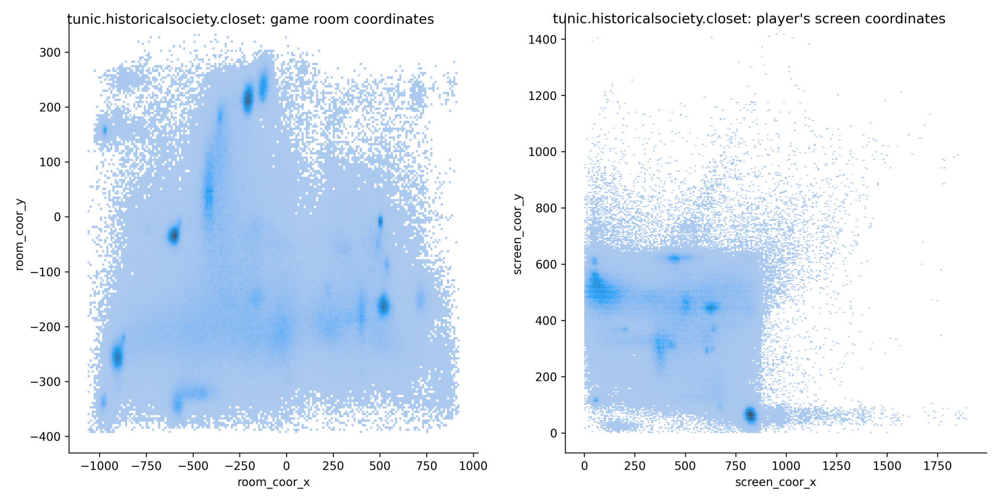

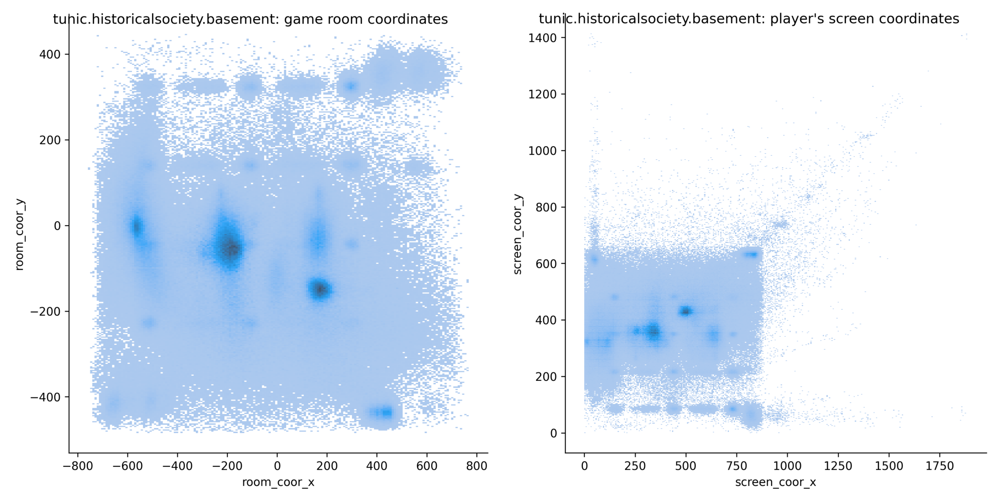

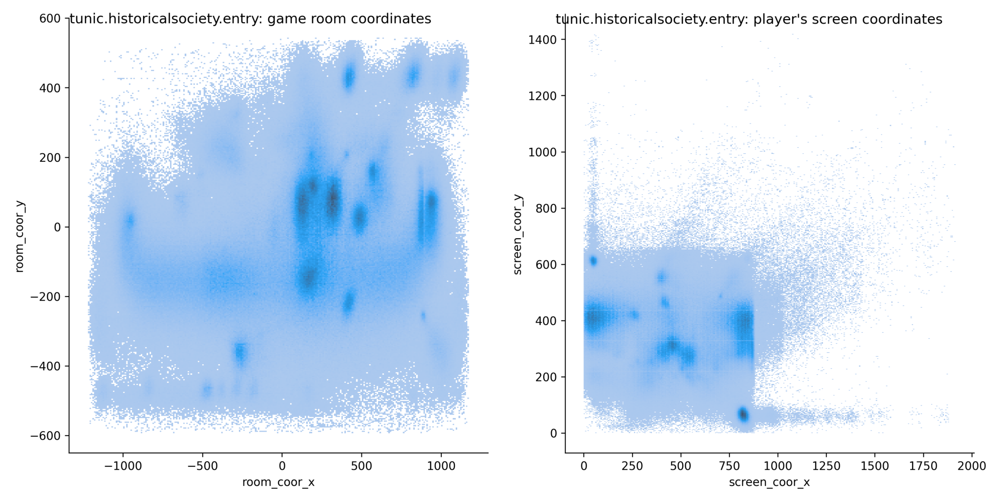

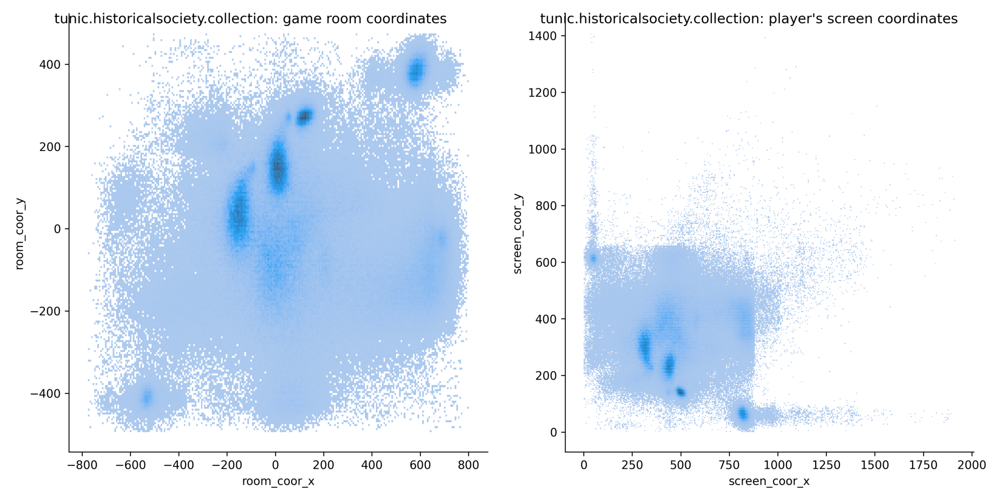

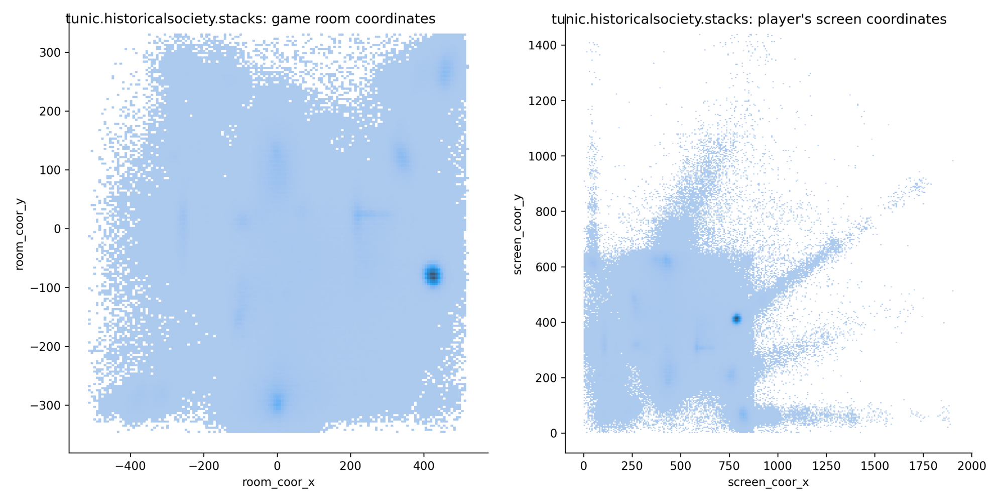

...

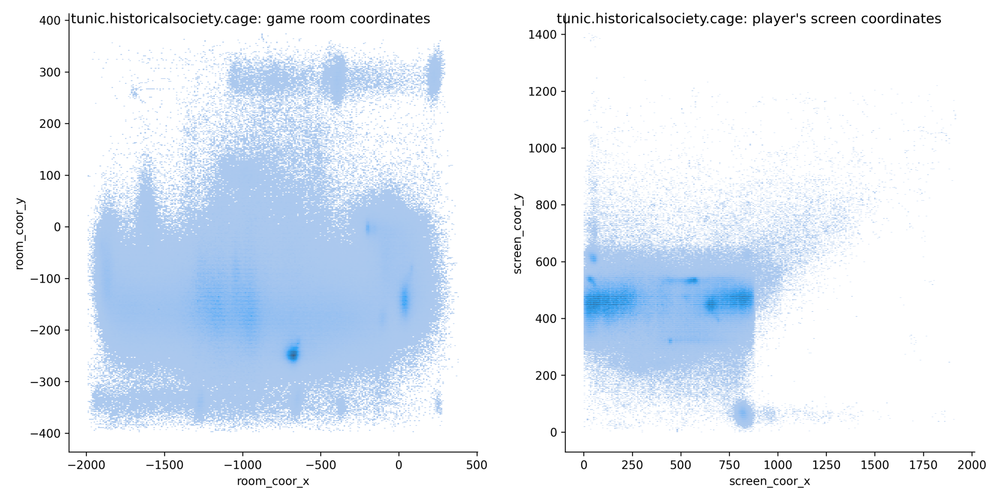

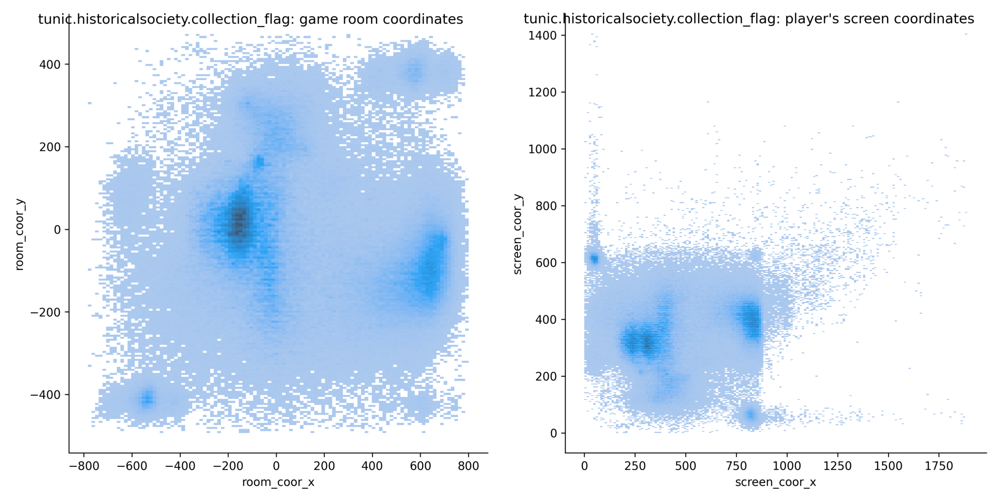

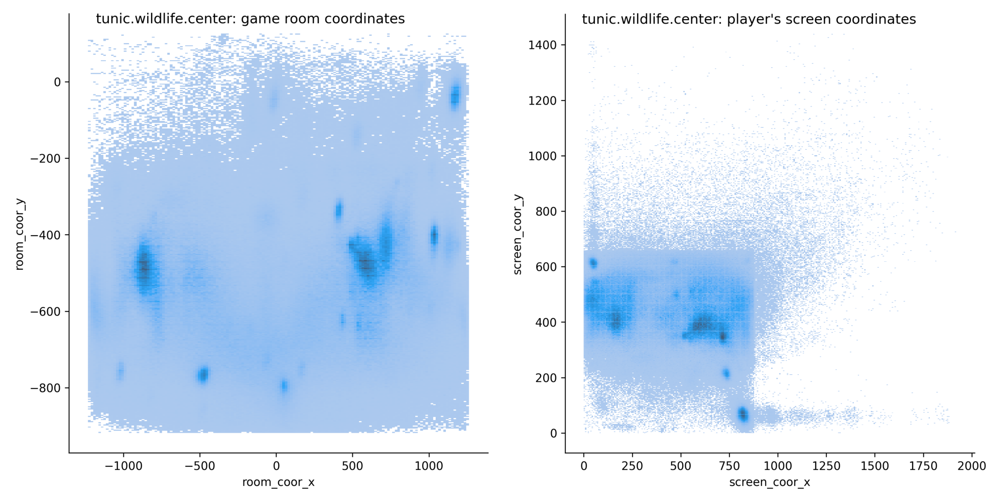

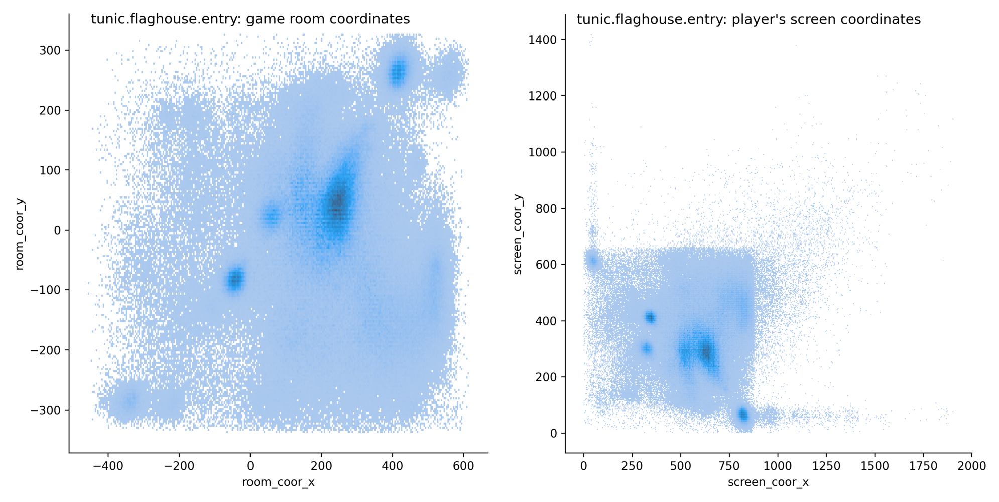

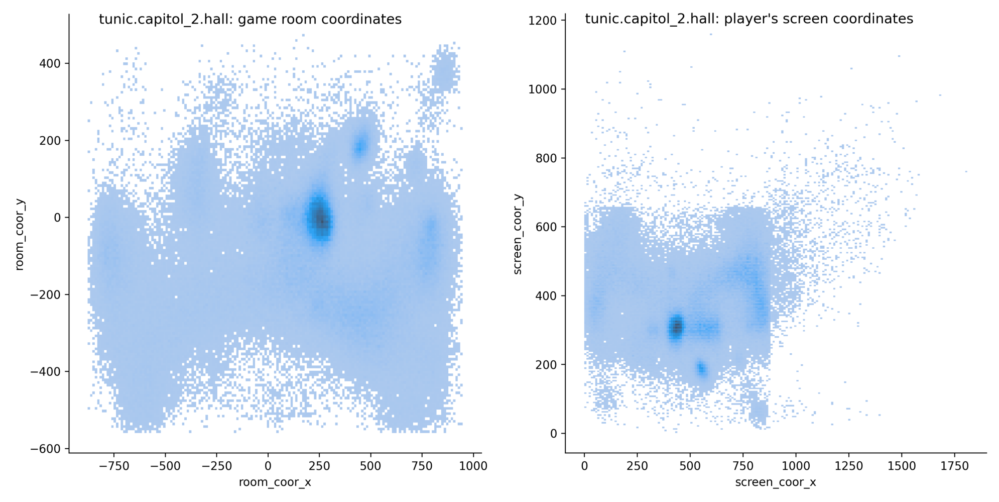

In [40]:
import matplotlib.image as mpimg

rooms = train_df['room_fqid'].unique().tolist()
for room in rooms:
    data_room = train_df[train_df['room_fqid'] == room]
    data_room = data_room[['room_coor_x', 'room_coor_y', 'screen_coor_x', 'screen_coor_y']].dropna().reset_index(drop=True)
    data_room = data_room.apply(pd.to_numeric, errors='coerce')
    g = sns.pairplot(
        data=data_room,
        x_vars=["room_coor_x"],
        y_vars=["room_coor_y"],
        kind='hist',
        height=6
    )
    g.fig.suptitle(f"{room}: game room coordinates")
    g.savefig('g0.png', dpi=300)
    plt.close(g.fig)
    
    g = sns.pairplot(
        data=data_room,
        x_vars=["screen_coor_x"],
        y_vars=["screen_coor_y"],
        kind='hist',
        height=6
    )
    g.fig.suptitle(f"{room}: player's screen coordinates")
    g.savefig('g1.png', dpi=300)
    plt.close(g.fig)
    
    f, ax = plt.subplots(1, 2, figsize=(20, 20))
    ax[0].imshow(mpimg.imread('g0.png'))
    ax[1].imshow(mpimg.imread('g1.png'))
    [axarr.set_axis_off() for axarr in ax.ravel()]
    plt.tight_layout()
    plt.show()

del room, rooms, data_room, g, f, ax

In [41]:
def plot_geo_location(df, session_id):
    session_df = df[df['session_id'] == session_id]
    rooms = session_df['room_fqid'].unique().tolist()
    for room in rooms:
        session_df_room = session_df[session_df['room_fqid'] == room]
        session_df_room = session_df_room[['room_coor_x', 'room_coor_y', 'screen_coor_x', 'screen_coor_y']].dropna().reset_index(drop=True)        
        plt.figure(figsize=(15, 6))        
        
        # room
        x = session_df_room['room_coor_x']
        y = session_df_room['room_coor_y']
        plt.subplot(1, 5, (1, 3))
        plt.plot(x, y, zorder=0, lw=0.5, color='steelblue')
        plt.scatter(x, y, s=5, color='grey')
        plt.scatter(x[0], y[0], s=200, lw=5, color='gold', marker='*')
        plt.scatter(x[-1:], y[-1:], s=200, lw=5, color='crimson', marker='*')
        plt.title(f"{session_id}: {room} (room)")
        plt.legend(['Cursor path', 'Click position', 'Start', 'End'])
        plt.gca().set_aspect('equal', adjustable='box')
        plt.xlim(-2000, 1300)
        plt.ylim(-920, 550)
        plt.xlabel("room_coor_x")
        plt.ylabel("room_coor_y")      
    
        # screen
        x = session_df_room['screen_coor_x']
        y = session_df_room['screen_coor_y']
        plt.subplot(1, 5, (4, 5))
        plt.plot(x, y, zorder=0, lw=0.5, color='lightcoral')
        plt.scatter(x, y, s=5, color='grey')
        plt.scatter(x[0], y[0], s=200, lw=5, color='gold', marker='*')
        plt.scatter(x[-1:], y[-1:], s=200, lw=5, color='crimson', marker='*')
        plt.title(f"session {session_id}: {room} (screen)")
        plt.legend(['Cursor path', 'Click position', 'Start', 'End'])
        plt.gca().set_aspect('equal', adjustable='box')
        plt.xlabel("screen_coor_x")
        plt.ylabel("screen_coor_y")
        plt.xlim(0, 2000)
        plt.ylim(0, 1500)
        plt.tight_layout()
        plt.show()

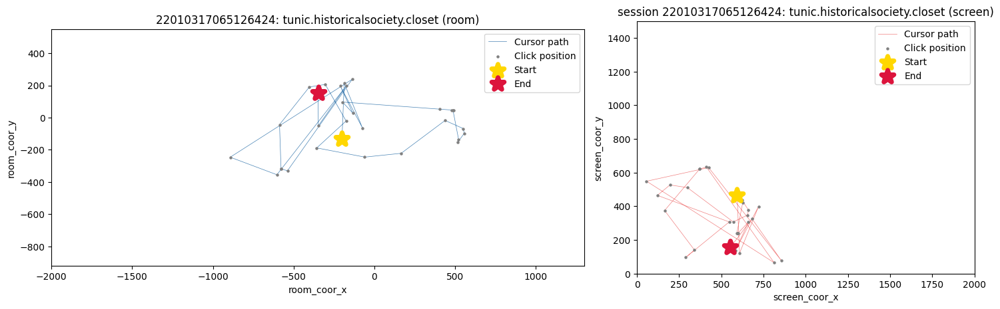

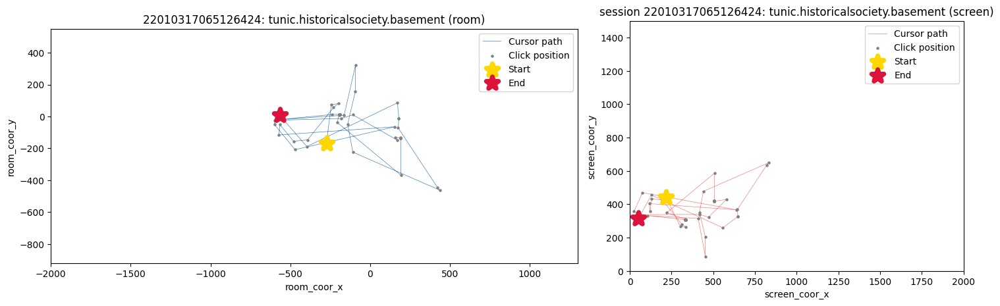

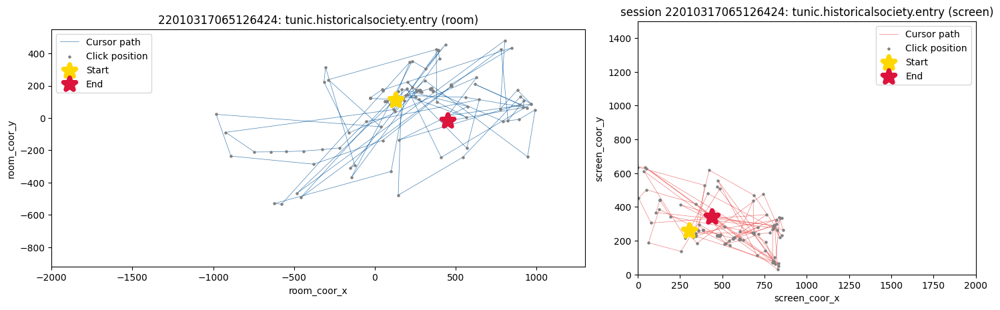

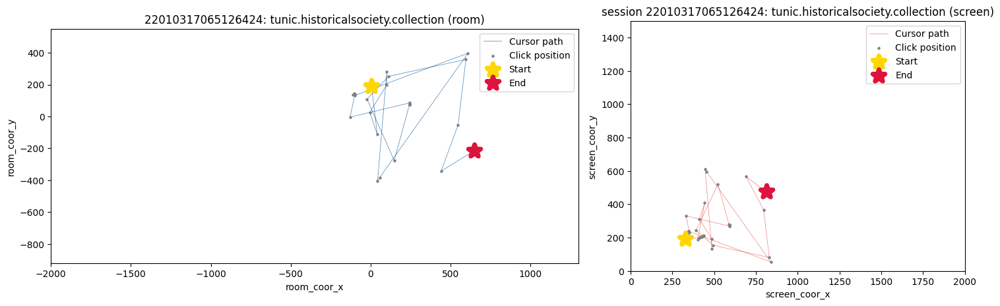

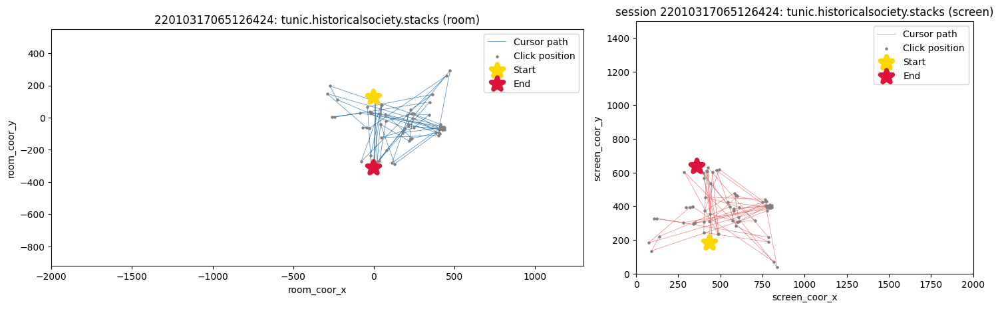

...

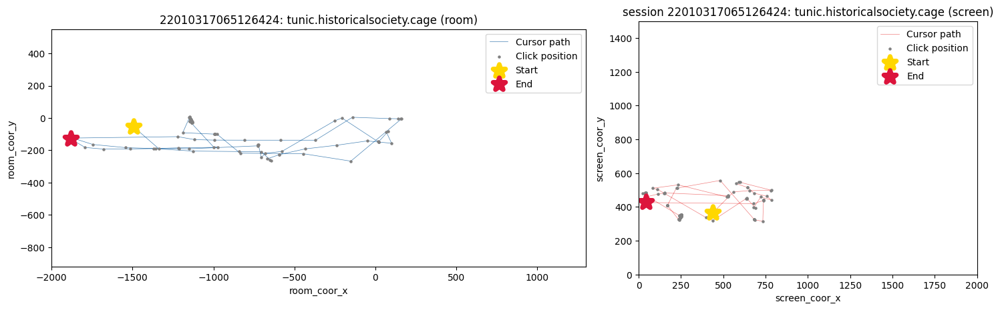

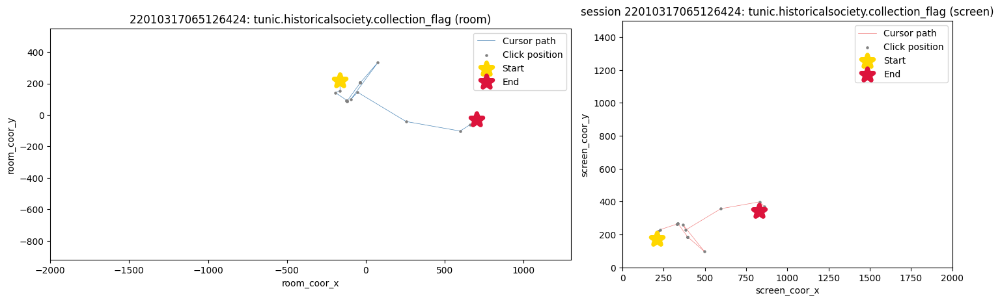

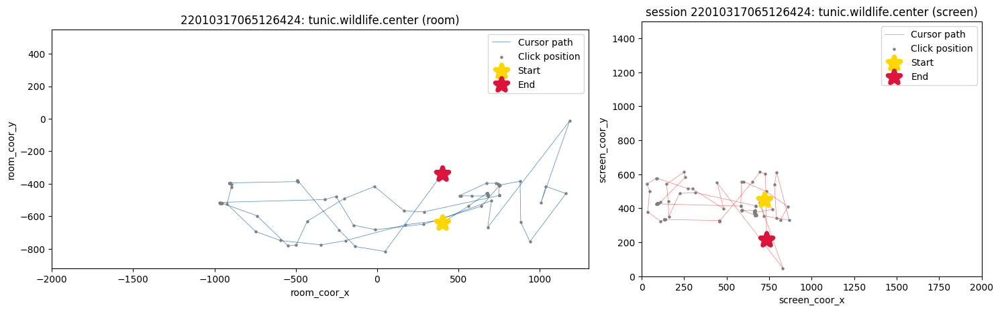

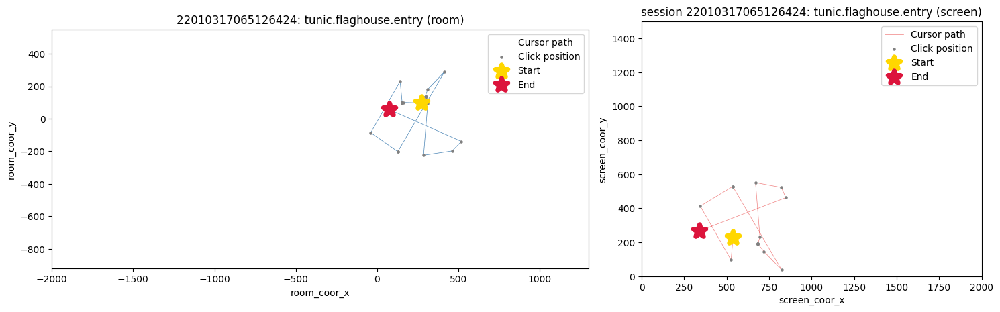

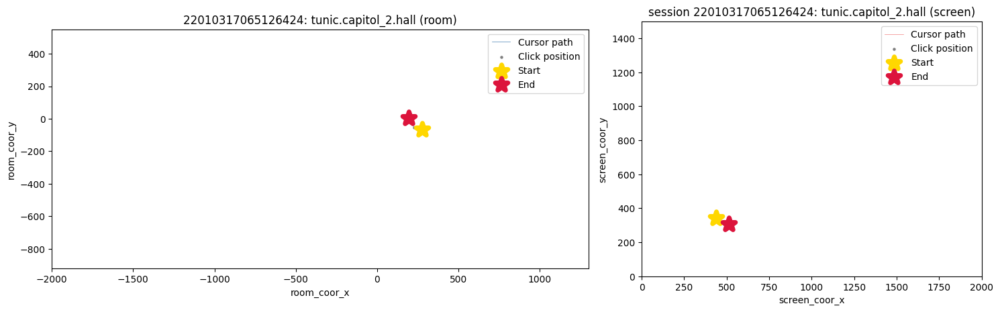

In [42]:
idx_dupl = train_df[['session_id', 'index']]
idx_dupl = idx_dupl[idx_dupl.duplicated()]
session_ids = train_df['session_id'].unique()
session_ids = session_ids[np.isin(session_ids, idx_dupl['session_id'].unique(), invert=True)]
del idx_dupl
# gc.collect()
plot_geo_location(train_df, np.random.choice(session_ids))
del session_ids

In [43]:
# text 
# There are two text variables:
# text: the text the player sees during this event; some of them are emoji in hex format

print(f"Number of unique text messages in train: {len(train_df['text'].unique())}")
print(f"Number of unique text messages in test: {len(test_df['text'].unique())}")

Number of unique text messages in train: 598
Number of unique text messages in test: 496


In [44]:
print(f"TOP-20 text messages:")
stat = pd.DataFrame([train_df['text'].value_counts(), test_df['text'].value_counts()]).T
stat.columns = ['train', 'test']
stat = stat.sort_values('train', ascending=False)
stat.head(20).style.format(precision=0)

TOP-20 text messages:


,train,test
undefined,355969,27
\u00f0\u0178\u02dc\u0090,48805,4
Hey!,47452,6
I should go to the Capitol and tell Mrs. M!,40463,4
This is perfect for the exhibit.,40218,4
Look at all those activists!,40215,4
"If I were you, I'd go to the library and do some digging.",39248,3
Ugh. Fine.,36009,5
\u00f0\u0178\u02dc\u00b4,35654,4
You can talk to a textile expert there.,35202,7


In [45]:
print(f"TOP-20 text_fqid messages:")
stat = pd.DataFrame([train_df['text_fqid'].value_counts(), test_df['text_fqid'].value_counts()]).T
stat.columns = ['train', 'test']
stat = stat.sort_values('train', ascending=False)
stat.head(20).style.format(precision=0)

TOP-20 text_fqid messages:


,train,test
tunic.historicalsociety.cage.confrontation,666557,75
tunic.wildlife.center.crane_ranger.crane,470755,51
tunic.historicalsociety.frontdesk.archivist.newspaper,429762,54
tunic.historicalsociety.entry.groupconvo,427180,51
tunic.wildlife.center.wells.nodeer,399967,49
tunic.historicalsociety.frontdesk.archivist.have_glass,394908,48
tunic.drycleaner.frontdesk.worker.hub,362883,39
tunic.historicalsociety.closet_dirty.gramps.news,334439,42
tunic.humanecology.frontdesk.worker.intro,300110,37
tunic.historicalsociety.frontdesk.archivist_glasses.confrontation,263308,31


In [46]:
print(f"TOP-30 text_fqid and text combinations:")
stat = pd.DataFrame([train_df[['text_fqid', 'text']].value_counts(), test_df[['text_fqid', 'text']].value_counts()]).T
stat.columns = ['train', 'test']
stat = stat.sort_values('train', ascending=False)
stat.head(30).style.format(precision=0)

TOP-30 text_fqid and text combinations:


In [47]:
# Furthermore, text_fqid includes two elements: room_fqid (game room) and fqid (person/object the player is interacting with). Examples:
train_df[['room_fqid', 'fqid', 'text_fqid']].dropna().drop_duplicates().head().style.hide_index()

/tmp/ipykernel_18/1768462347.py:2: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  train_df[['room_fqid', 'fqid', 'text_fqid']].dropna().drop_duplicates().head().style.hide_index()


room_fqid,fqid,text_fqid
tunic.historicalsociety.closet,intro,tunic.historicalsociety.closet.intro
tunic.historicalsociety.closet,gramps,tunic.historicalsociety.closet.gramps.intro_0_cs_0
tunic.historicalsociety.closet,teddy,tunic.historicalsociety.closet.teddy.intro_0_cs_0
tunic.historicalsociety.closet,teddy,tunic.historicalsociety.closet.teddy.intro_0_cs_5
tunic.historicalsociety.closet,photo,tunic.historicalsociety.closet.photo


Share of events with page in train: 2.15%
Share of events with page in test: 4.1%


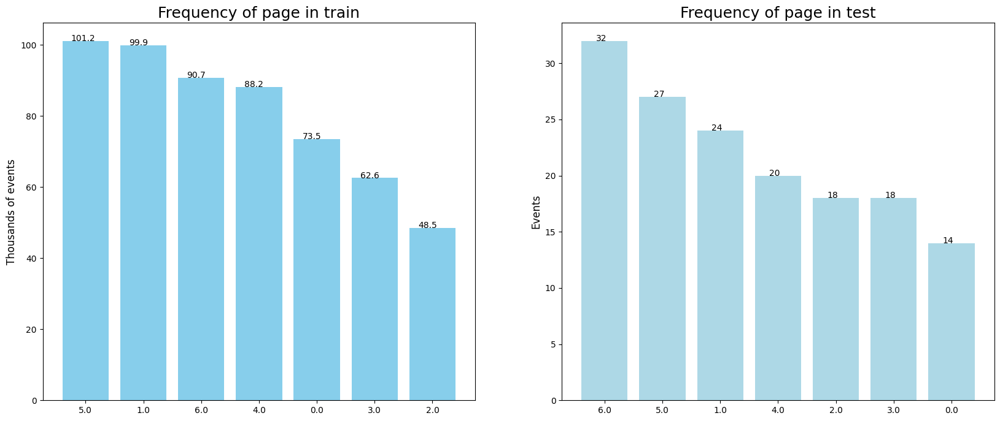

In [48]:
# page is the page number of the event (only for notebook-related events). Share of notebook-related events is small:

print(f"Share of events with page in train: {round(train_df['page'].count() / len(train_df)*100, 2)}%")
print(f"Share of events with page in test: {round(test_df['page'].count() / len(test_df)*100, 2)}%")

page_counts_train = train_df['page'].value_counts()/1000
page_counts_test = test_df['page'].value_counts()

plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.bar(page_counts_train.index, page_counts_train.values, color='skyblue')
plt.ylabel("Thousands of events", fontsize=12)
plt.title("Frequency of page in train", fontsize=18)
for i, v in enumerate(page_counts_train.values):
    plt.text(i-0.25, v, str(round(v, 1)))
plt.xticks()

plt.subplot(1, 2, 2)
plt.bar(page_counts_test.index, page_counts_test.values, color='lightblue')
plt.ylabel("Events", fontsize=12)
plt.title("Frequency of page in test", fontsize=18)
for i, v in enumerate(page_counts_test.values):
    plt.text(i-0.15, v, str(int(v)))
del page_counts_train, page_counts_test
plt.xticks()
plt.show()

In [49]:
#  hover 
# hover_duration: how long (in milliseconds) the hover happened for (only for hover events). There are two types of hover events:

# Object_Hover - In each chapter of the game, some tasks have to be performed by the student, like clicking the slip on the t-shirt in the 1st Chapter of the game. This slip is an object. If the student takes the mouse pointer above this object, an object_hover is recorded. The duration for which the pointer stays above this object, is recorded in the hover_duration. If he/she clicks on the object, it's an object_click
# Map_Hover - In the map, there are many places a student can click to go there. When he/she takes the pointer above any place in the map, a map_hover event is recorded. Just like in object_hover, hover_duration is the duration for which the pointer stays above that place. And when the student clicks on any place, it's a map_click

# Share of hover events is small:

print(f"Share of events with hover_duration in train: {round(train_df['hover_duration'].count() / len(train_df)*100, 2)}%")
print(f"Share of events with hover_duration in test: {round(test_df['hover_duration'].count() / len(test_df)*100, 2)}%")

hover_duration_train = np.round(train_df[train_df['hover_duration'].notna()]['hover_duration'].astype(np.int32)/1000.0, 1)
hover_duration_test = np.round(test_df[test_df['hover_duration'].notna()]['hover_duration'].astype(np.int32)/1000.0, 1)

Share of events with hover_duration in train: 7.61%
Share of events with hover_duration in test: 9.47%


In [50]:
stat = pd.DataFrame([hover_duration_train.describe().index.to_list(),
                    hover_duration_train.describe().values,
                    hover_duration_test.describe().values]).T
stat.columns = [' ', 'hover_duration in train, seconds', 'hover_duration in test, seconds']
stat[stat.columns.to_list()[1:]] = stat[stat.columns.to_list()[1:]].apply(pd.to_numeric, errors='coerce' )
print('hover_duration statistics:')
stat[1:].style.hide_index().format(precision=2).background_gradient(cmap='YlGn')

hover_duration statistics:


/tmp/ipykernel_18/2940395851.py:7: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  stat[1:].style.hide_index().format(precision=2).background_gradient(cmap='YlGn')


,"hover_duration in train, seconds","hover_duration in test, seconds"
mean,3.47,1.41
std,460.20,2.67
min,0.00,0.00
25%,0.10,0.10
50%,0.40,0.40
75%,1.30,1.30
max,245163.70,23.50


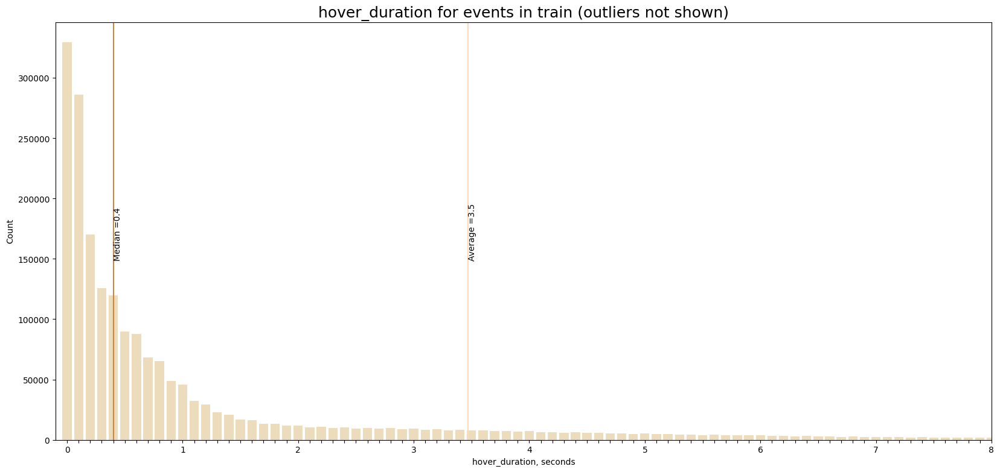

In [51]:
mean_hover_duration_train = hover_duration_train.mean()
median_hover_duration_train = hover_duration_train.median()
hover_duration_train_counts = np.round(hover_duration_train*10, 0).astype(np.int64).value_counts()

plt.figure(figsize=(20, 9))
g = sns.barplot(x=hover_duration_train_counts.index, y=np.round(hover_duration_train_counts.values, 0), color='wheat')
plt.title('hover_duration for events in train (outliers not shown)', fontsize=18)
g.set_xticklabels(['{}'.format(int(num/10)) if i % 10 == 0 else '' for i, num in enumerate(g.get_xticks())])
g.set(xlabel='hover_duration, seconds', ylabel='Count')
g.axvline(x=mean_hover_duration_train*10, color="peachpuff")
g.text(mean_hover_duration_train*10, 150000, f'Average ={round(mean_hover_duration_train, 1)}', rotation=90)
plt.axvline(x=median_hover_duration_train*10, color="peru")
plt.text(median_hover_duration_train*10, 150000, f'Median ={round(median_hover_duration_train, 1)}', rotation=90)
plt.xlim(-1, 8*10)
del mean_hover_duration_train, median_hover_duration_train, hover_duration_train_counts
plt.show()

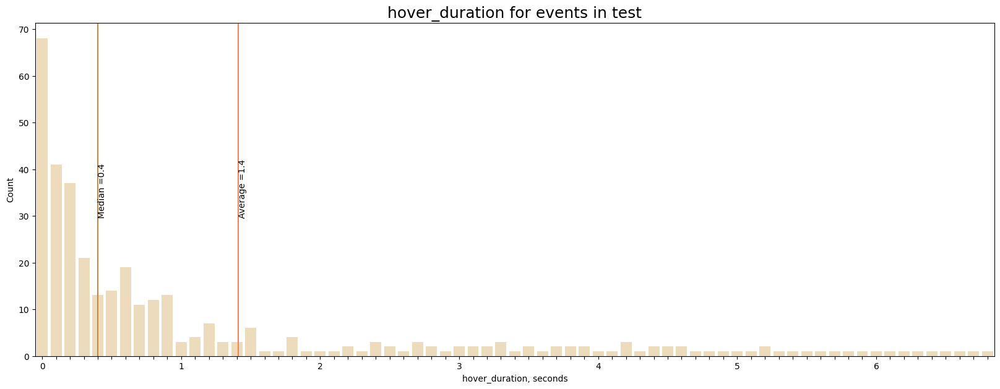

In [52]:
mean_hover_duration_test = hover_duration_test.mean()
median_hover_duration_test = hover_duration_test.median()
hover_duration_test_counts = np.round(hover_duration_test*10, 0).astype(np.int64).value_counts()

plt.figure(figsize=(20, 7))
g = sns.barplot(x=hover_duration_test_counts.index, y=hover_duration_test_counts.values, color='wheat')
plt.title('hover_duration for events in test', fontsize=18)
g.set_xticklabels(['{}'.format(int(num/10)) if i % 10 == 0 else '' for i, num in enumerate(g.get_xticks())])
g.set(xlabel='hover_duration, seconds', ylabel='Count')
g.axvline(x=mean_hover_duration_test*10, color="coral")
g.text(mean_hover_duration_test*10, 30, f'Average ={round(mean_hover_duration_test, 1)}', rotation=90)
g.axvline(x=median_hover_duration_test*10, color="peru")
g.text(median_hover_duration_test*10, 30, f'Median ={round(median_hover_duration_test, 1)}', rotation=90)
del mean_hover_duration_test, median_hover_duration_test, hover_duration_test_counts, hover_duration_train, hover_duration_test
plt.show()

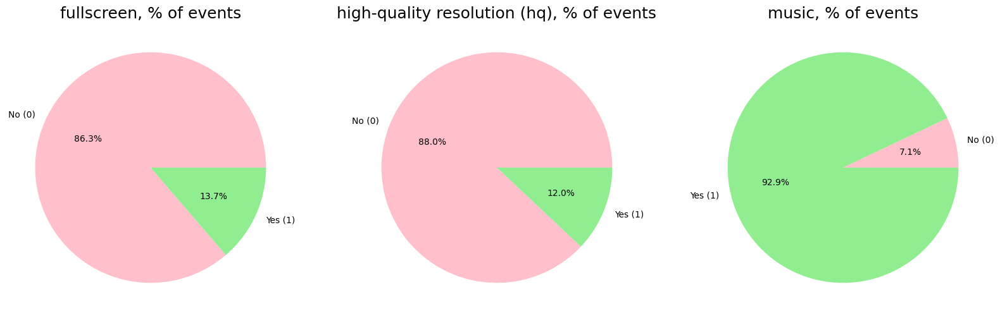

In [53]:
# Finally, we also have game properties:

# fullscreen - whether the player is in fullscreen mode
# hq - whether the game is in high-quality
# music - whether the game music is on or off
# We can assume that 0 in each of these columns corresponds to No, and 1 to Yes.

plt.figure(figsize=(20, 14))
plt.subplot(1, 3, 1)
plt.pie(train_df['fullscreen'].value_counts().sort_index(), labels = ['No (0)', 'Yes (1)'], colors = ['pink', 'lightgreen'], autopct='%.1f%%')
plt.title('fullscreen, % of events', fontsize=18)

plt.subplot(1, 3, 2)
plt.pie(train_df['hq'].value_counts().sort_index(), labels = ['No (0)', 'Yes (1)'], colors = ['pink', 'lightgreen'], autopct='%.1f%%')
plt.title('high-quality resolution (hq), % of events', fontsize=18)

plt.subplot(1, 3, 3)
plt.pie(train_df['music'].value_counts().sort_index(), labels = ['No (0)', 'Yes (1)'], colors = ['pink', 'lightgreen'], autopct='%.1f%%')
plt.title('music, % of events', fontsize=18)
plt.show()

Percent of sessions where fullscreen is the same for all events: 100.0%
Percent of sessions where hq is the same for all events: 100.0%
Percent of sessions where music is the same for all events: 100.0%


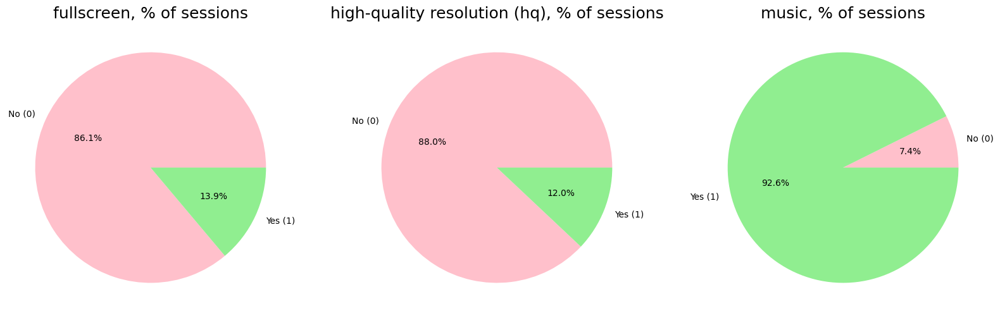

In [54]:
print(f"Percent of sessions where fullscreen is the same for all events: {train_df.groupby('session_id')['fullscreen'].nunique().eq(1).sum()/train_df['session_id'].nunique()*100}%")
print(f"Percent of sessions where hq is the same for all events: {train_df.groupby('session_id')['hq'].nunique().eq(1).sum()/train_df['session_id'].nunique()*100}%")
print(f"Percent of sessions where music is the same for all events: {train_df.groupby('session_id')['music'].nunique().eq(1).sum()/train_df['session_id'].nunique()*100}%")

# gc.collect()
plt.figure(figsize=(20, 14))
plt.subplot(1, 3, 1)
plt.pie(train_df.groupby('session_id')['fullscreen'].median().value_counts().sort_index(), 
        labels = ['No (0)', 'Yes (1)'], colors = ['pink', 'lightgreen'], autopct='%.1f%%')
plt.title('fullscreen, % of sessions', fontsize=18)

plt.subplot(1, 3, 2)
plt.pie(train_df.groupby('session_id')['hq'].median().value_counts().sort_index(), 
        labels = ['No (0)', 'Yes (1)'], colors = ['pink', 'lightgreen'], autopct='%.1f%%')
plt.title('high-quality resolution (hq), % of sessions', fontsize=18)

plt.subplot(1, 3, 3)
plt.pie(train_df.groupby('session_id')['music'].median().value_counts().sort_index(), 
        labels = ['No (0)', 'Yes (1)'], colors = ['pink', 'lightgreen'], autopct='%.1f%%')
plt.title('music, % of sessions', fontsize=18)
plt.show()